### Project : Opus Classifica: Decoding Intelligence from Data







In [337]:
#All imports
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
import random
import math

In [338]:
np.random.seed(0)
# Set the random seed for reproducibility
random.seed(0)

## Linear Tales: Least Squares and the Whispering Boundaries"

**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




############### Gaussian Distriubtion ###############
################ 0 1 Encoding  ##################
Accuracy:  0.8975
Decision Boundary: 0.2986072987140971 * x1 + 0.3211087551256406 * x2 + -0.45452914731668836 = 1/2
x1-intercept: 3.196603537245105, x2-intercept: 2.9726039296038773
################ -1 1 Encoding##################
Accuracy :  0.8975
Decision Boundary: 0.5972145974281928 * x1 + 0.642217510251283 * x2 + -1.9090582946333783 = 0
x1-intercept: 3.1966035372451147, x2-intercept: 2.972603929603871


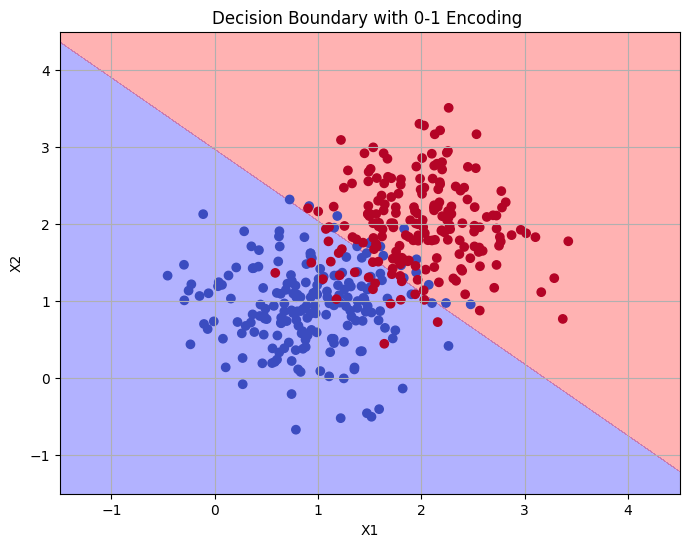

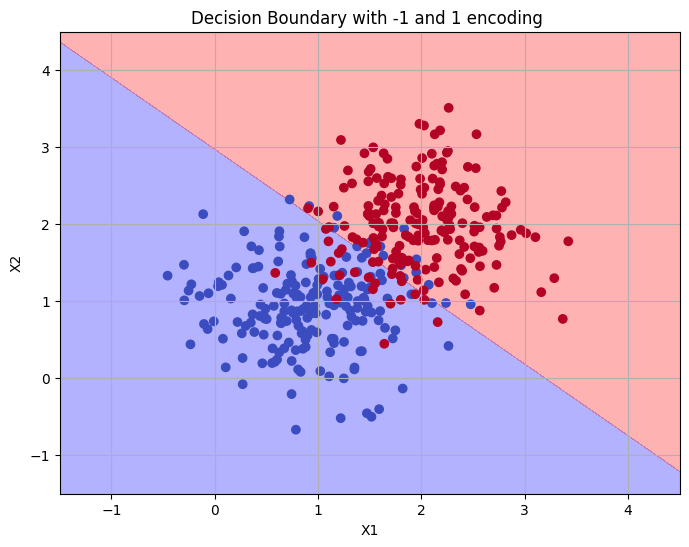

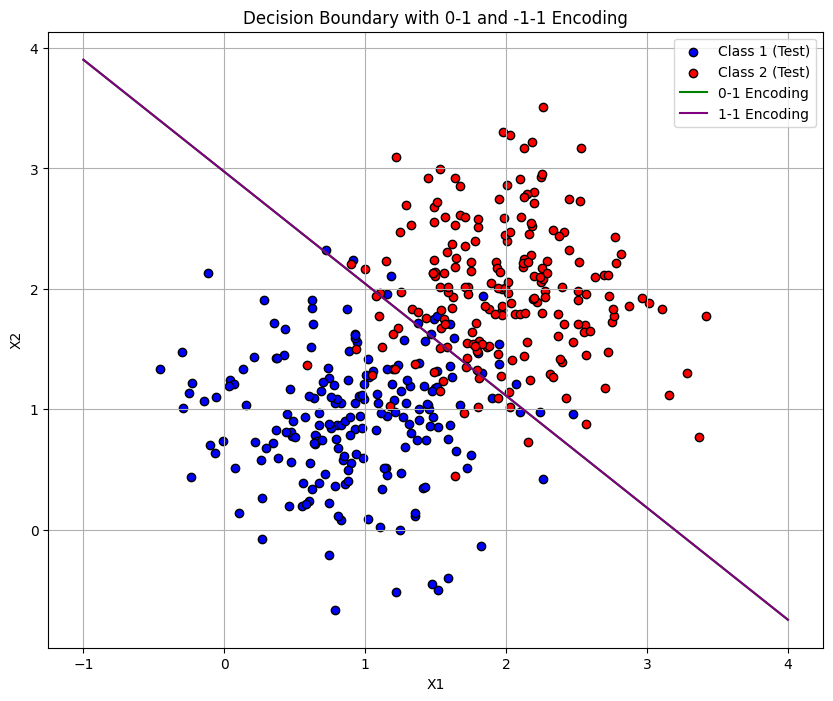

In [339]:
print("############### Gaussian Distriubtion ###############")

########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))                #Combine class1 training and class2 training data to get total training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))        #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200) #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200) #Class2 testing data
te_data = np.vstack((class1_te, class2_te))               #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.hstack((np.zeros(200), np.ones(200))).reshape(-1,1)      #Class labels. Assign the value "0" to class1 and the value "1" to class2.






########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test,a,b):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels


    #Add a column of ones to the training data to account for the bias term
    X_train = np.hstack((np.ones((X_train.shape[0], 1)), X_train)) #Add a column of ones to the training data
    X_test = np.hstack((np.ones((X_test.shape[0], 1)), X_test))   #Add a column of ones to the testing data



    #Impliment pseudo inverse solution to get the weight vector

    #Compute the pseudo inverse of the training data matrix
    
    w_psedo = np.linalg.inv(X_train.T @ X_train) @ X_train.T @ Y_train #Compute the pseudo inverse of the training data matrix
    w_psedo = w_psedo.reshape(-1, 1) #Reshape the weight vector to be a column vector


    #Predict the lables of test data using the pseudo inverse solution
    Y_pred = X_test @ w_psedo #Predict the labels of test data using the pseudo inverse solution
    
    thresh = (a+b)/2
    Y_pred[Y_pred >= thresh] = a #Convert the predicted labels to binary values
    Y_pred[Y_pred < thresh] = b  #Convert the predicted labels to binary values







    #Return the predicted test labels
    return Y_pred,w_psedo







#Get the test data predictions
predictions_01,w_psedo_01 = LS_Classify(tr_data, tr_targets, te_data,1,0)


##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy

    #Compute the accuracy
    accuracy = np.sum(Y_test == Y_pred) / len(Y_test) #Compute the accuracy


    #Return the accuracy
    return accuracy


print("################ 0 1 Encoding  ##################")

print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions_01)) #Print the accuracy of the model


##########################################
#Part-1)-d: Visualize the decision boundary
##########################################



x_min, x_max = -1.5, 4.5 #X-axis limits


# Generate a grid of points to evaluate the decision boundary
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(x_min, x_max, 200))
grid = np.c_[xx.ravel(), yy.ravel()]
grid = np.hstack((np.ones((grid.shape[0], 1)), grid))  # Add bias term

# Compute the decision boundary
decision_values = grid @ w_psedo_01
decision_values = decision_values.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, decision_values, levels=[-np.inf, 0.5, np.inf], colors=['blue', 'red'], alpha=0.3, linestyles=['--'])
plt.xlabel('X1') #X-axis label
plt.ylabel('X2') #Y-axis label
plt.title('Decision Boundary with 0-1 Encoding ') #Title of the plot

plt.scatter(te_data[:,0], te_data[:,1], c=te_targets, cmap='coolwarm', label='Test Data') #Plot the training data
plt.grid(True)
plt.plot()

print(f"Decision Boundary: {w_psedo_01[1, 0]} * x1 + {w_psedo_01[2, 0]} * x2 + {w_psedo_01[0, 0]} = 1/2")

x1_intercept = (1/2-w_psedo_01[0, 0]) / w_psedo_01[1, 0]
x2_intercept = (1/2-w_psedo_01[0, 0]) / w_psedo_01[2, 0]

print(f"x1-intercept: {x1_intercept}, x2-intercept: {x2_intercept}")


##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################
print("################ -1 1 Encoding##################")



tr_targets = np.hstack((-np.ones(50), np.ones(50)))        # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
te_targets = np.hstack((-np.ones(200), np.ones(200))).reshape(-1, 1)  # Class labels. Assign the value "-1" to class1 and the value "1" to class2.


predictions_1p1,w_psedo_1p1 = LS_Classify(tr_data, tr_targets, te_data,1,-1)

print("Accuracy : ", LS_Classify_Accuracy(te_targets, predictions_1p1)) # Print the accuracy of the model

x_min, x_max = -1.5, 4.5 #X-axis limits

# Generate a grid of points to evaluate the decision boundary
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(x_min, x_max, 200))
grid = np.c_[xx.ravel(), yy.ravel()]
grid = np.hstack((np.ones((grid.shape[0], 1)), grid))  # Add bias term

# Compute the decision boundary
decision_values = grid @ w_psedo_1p1
decision_values = decision_values.reshape(xx.shape)
plt.figure(figsize=(8, 6))

# Plot the decision boundary
plt.contourf(xx, yy, decision_values, levels=[-np.inf, 0, np.inf], colors=['blue', 'red'], alpha=0.3, linestyles=['--'])
plt.xlabel('X1') #X-axis label
plt.ylabel('X2') #Y-axis label
plt.title('Decision Boundary with -1 and 1 encoding ') #Title of the plot
plt.grid(True)
plt.scatter(te_data[:,0], te_data[:,1], c=te_targets, cmap='coolwarm', label='Test Data') #Plot the training data

plt.plot()


print(f"Decision Boundary: {w_psedo_1p1[1, 0]} * x1 + {w_psedo_1p1[2, 0]} * x2 + {w_psedo_1p1[0, 0]} = 0")

x1_intercept = -w_psedo_1p1[0, 0] / w_psedo_1p1[1, 0]
x2_intercept = -w_psedo_1p1[0, 0] / w_psedo_1p1[2, 0]

print(f"x1-intercept: {x1_intercept}, x2-intercept: {x2_intercept}")






#### Plot both decision boundaries togethor



plt.figure(figsize=(10, 8))
plt.title("Decision Boundary with 0-1 and -1-1 Encoding")
plt.xlabel("X1")
plt.ylabel("X2")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', edgecolor='k', label='Class 1 (Test)')
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', edgecolor='k', label='Class 2 (Test)')


### Plot the decision boundaries for both encodings
x1 = np.linspace(-1, 4, 200)  # X-axis values
x2_01 = (0.5-w_psedo_01[0][0] - w_psedo_01[1][0]*x1)/w_psedo_01[2][0]
x2_1p1 = (-w_psedo_1p1[0][0] - w_psedo_1p1[1][0]*x1)/w_psedo_1p1[2][0]


plt.plot(x1,x2_01,color='Green',label='0-1 Encoding')
plt.plot(x1,x2_1p1,color='Purple',label='1-1 Encoding')
plt.grid(True)
plt.legend()

plt.show()












## Laplacian Distribution

################ Laplacian Distribution ##################
################ 0 1 Encoding  ##################
Accuracy:  0.9025
Decision Boundary: 0.3224271819447485 * x1 + 0.29469010696481673 * x2 + -0.4585669242167714 = 1/2
x1-intercept: 2.9729718147058475, x2-intercept: 3.2527964175302815
################ -1 1 Encoding##################
Accuracy :  0.9025
Decision Boundary: 0.6448543638894964 * x1 + 0.5893802139296329 * x2 + -1.9171338484335414 = 0
x1-intercept: 2.9729718147058484, x2-intercept: 3.2527964175302824


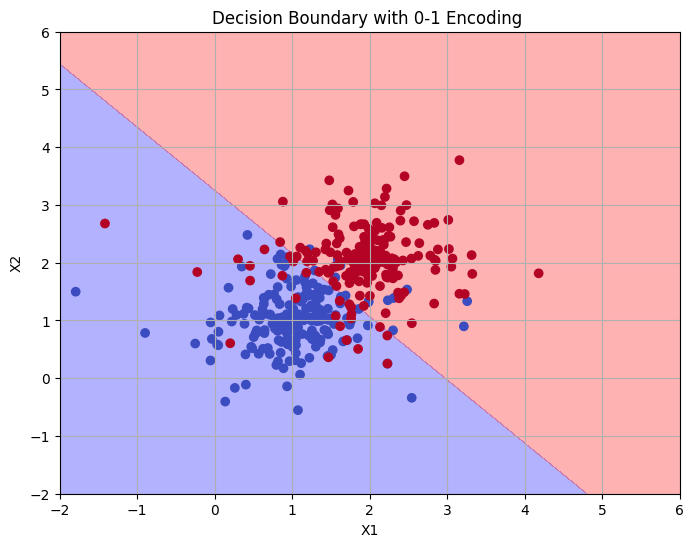

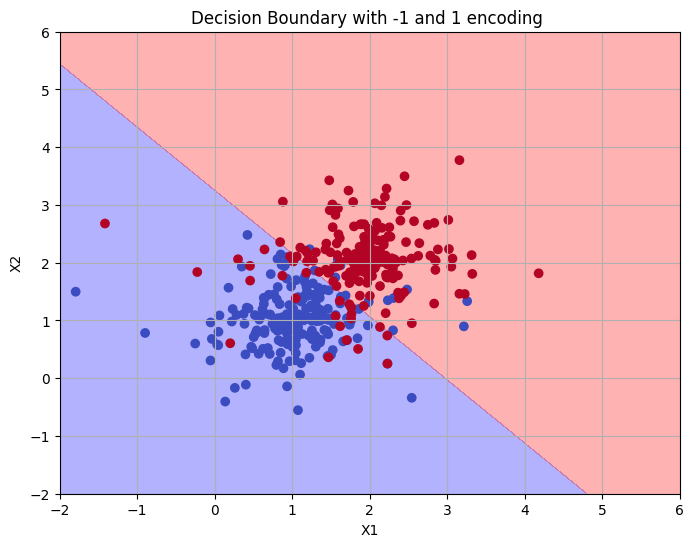

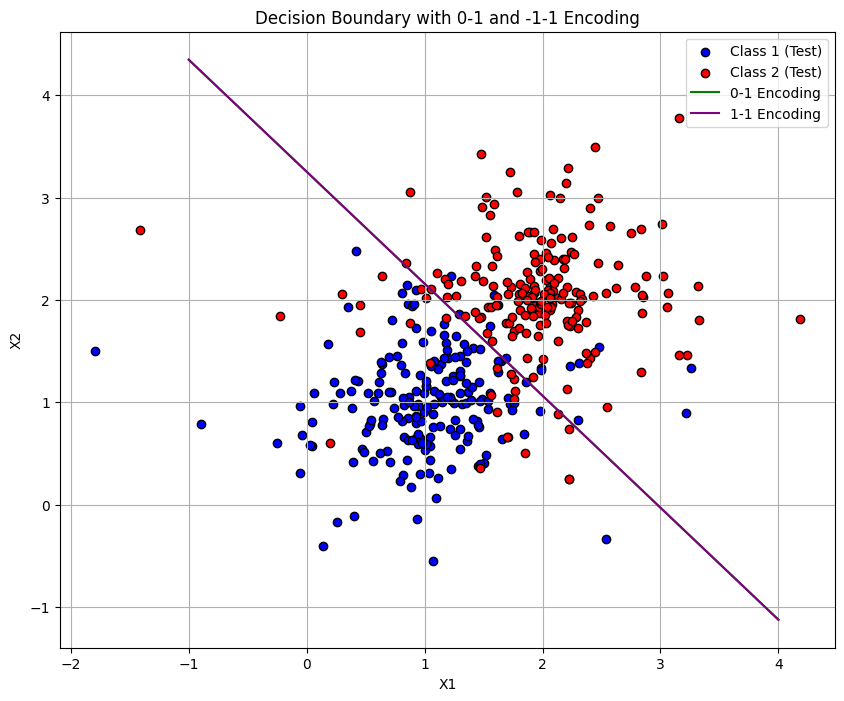

In [340]:
##########################################
#Part-1)-f: Repeat the experiments with Laplacial distribution
##########################################

print("################ Laplacian Distribution ##################")
########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr1 = np.random.laplace(mean1[0], (cov[0][0]/2)**0.5, 50)
class1_tr1 = np.reshape(class1_tr1, (class1_tr1.shape[0], 1))
class1_tr2 = np.random.laplace(mean1[1], (cov[0][0]/2)**0.5, 50)
class1_tr2 = np.reshape(class1_tr2, (class1_tr2.shape[0], 1))
class1_tr = np.hstack((class1_tr1, class1_tr2))

class2_tr1 = np.random.laplace(mean2[0], (cov[1][1]/2)**0.5, 50)
class2_tr1 = np.reshape(class2_tr1, (class2_tr1.shape[0], 1))
class2_tr2 = np.random.laplace(mean2[1], (cov[1][1]/2)**0.5, 50)
class2_tr2 = np.reshape(class2_tr2, (class2_tr2.shape[0], 1))
class2_tr = np.hstack((class2_tr1, class2_tr2))


tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.concatenate((np.repeat(np.array([0]), 50), np.repeat(np.array([1]), 50)))
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te1 = np.random.laplace(mean1[0], (cov[0][0]/2)**0.5, 200)
class1_te1 = np.reshape(class1_te1, (class1_te1.shape[0], 1))
class1_te2 = np.random.laplace(mean1[1], (cov[0][0]/2)**0.5, 200)
class1_te2 = np.reshape(class1_te2, (class1_te2.shape[0], 1))
class1_te = np.hstack((class1_te1, class1_te2))

class2_te1 = np.random.laplace(mean2[0], (cov[1][1]/2)**0.5, 200)
class2_te1 = np.reshape(class2_te1, (class2_te1.shape[0], 1))
class2_te2 = np.random.laplace(mean2[1], (cov[1][1]/2)**0.5, 200)
class2_te2 = np.reshape(class2_te2, (class2_te2.shape[0], 1))
class2_te = np.hstack((class2_te1, class2_te2))

te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([0]), 200), np.repeat(np.array([1]), 200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))







#Get the test data predictions
predictions_01,w_psedo_01 = LS_Classify(tr_data, tr_targets, te_data,1,0)


print("################ 0 1 Encoding  ##################")

print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions_01)) #Print the accuracy of the model


##########################################
#Part-1)-d: Visualize the decision boundary
##########################################



x_min, x_max = -2, 6 #X-axis limits


# Generate a grid of points to evaluate the decision boundary
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(x_min, x_max, 200))
grid = np.c_[xx.ravel(), yy.ravel()]
grid = np.hstack((np.ones((grid.shape[0], 1)), grid))  # Add bias term

# Compute the decision boundary
decision_values = grid @ w_psedo_01
decision_values = decision_values.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, decision_values, levels=[-np.inf, 0.5, np.inf], colors=['blue', 'red'], alpha=0.3, linestyles=['--'])
plt.xlabel('X1') #X-axis label
plt.ylabel('X2') #Y-axis label
plt.title('Decision Boundary with 0-1 Encoding ') #Title of the plot

plt.scatter(te_data[:,0], te_data[:,1], c=te_targets, cmap='coolwarm', label='Test Data') #Plot the training data
plt.grid(True)
plt.plot()

print(f"Decision Boundary: {w_psedo_01[1, 0]} * x1 + {w_psedo_01[2, 0]} * x2 + {w_psedo_01[0, 0]} = 1/2")

x1_intercept = (1/2-w_psedo_01[0, 0]) / w_psedo_01[1, 0]
x2_intercept = (1/2-w_psedo_01[0, 0]) / w_psedo_01[2, 0]

print(f"x1-intercept: {x1_intercept}, x2-intercept: {x2_intercept}")


##########################################
#Part-1)-e: Change the target label notation, and repeat the experiments
##########################################
print("################ -1 1 Encoding##################")



tr_targets = np.hstack((-np.ones(50), np.ones(50)))        # Class labels. Assign the value "-1" to class1 and the value "1" to class2.
te_targets = np.hstack((-np.ones(200), np.ones(200))).reshape(-1, 1)  # Class labels. Assign the value "-1" to class1 and the value "1" to class2.


predictions_1p1,w_psedo_1p1 = LS_Classify(tr_data, tr_targets, te_data,1,-1)

print("Accuracy : ", LS_Classify_Accuracy(te_targets, predictions_1p1)) # Print the accuracy of the model

x_min, x_max = -2, 6 #X-axis limits

# Generate a grid of points to evaluate the decision boundary
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200), np.linspace(x_min, x_max, 200))
grid = np.c_[xx.ravel(), yy.ravel()]
grid = np.hstack((np.ones((grid.shape[0], 1)), grid))  # Add bias term

# Compute the decision boundary
decision_values = grid @ w_psedo_1p1
decision_values = decision_values.reshape(xx.shape)
plt.figure(figsize=(8, 6))

# Plot the decision boundary
plt.contourf(xx, yy, decision_values, levels=[-np.inf, 0, np.inf], colors=['blue', 'red'], alpha=0.3, linestyles=['--'])
plt.xlabel('X1') #X-axis label
plt.ylabel('X2') #Y-axis label
plt.title('Decision Boundary with -1 and 1 encoding ') #Title of the plot
plt.grid(True)
plt.scatter(te_data[:,0], te_data[:,1], c=te_targets, cmap='coolwarm', label='Test Data') #Plot the training data

plt.plot()


print(f"Decision Boundary: {w_psedo_1p1[1, 0]} * x1 + {w_psedo_1p1[2, 0]} * x2 + {w_psedo_1p1[0, 0]} = 0")

x1_intercept = -w_psedo_1p1[0, 0] / w_psedo_1p1[1, 0]
x2_intercept = -w_psedo_1p1[0, 0] / w_psedo_1p1[2, 0]

print(f"x1-intercept: {x1_intercept}, x2-intercept: {x2_intercept}")






#### Plot both decision boundaries togethor



plt.figure(figsize=(10, 8))
plt.title("Decision Boundary with 0-1 and -1-1 Encoding")
plt.xlabel("X1")
plt.ylabel("X2")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', edgecolor='k', label='Class 1 (Test)')
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', edgecolor='k', label='Class 2 (Test)')


### Plot the decision boundaries for both encodings
x1 = np.linspace(-1, 4, 200)  # X-axis values
x2_01 = (0.5-w_psedo_01[0][0] - w_psedo_01[1][0]*x1)/w_psedo_01[2][0]
x2_1p1 = (-w_psedo_1p1[0][0] - w_psedo_1p1[1][0]*x1)/w_psedo_1p1[2][0]


plt.plot(x1,x2_01,color='Green',label='0-1 Encoding')
plt.plot(x1,x2_1p1,color='Purple',label='1-1 Encoding')
plt.grid(True)
plt.legend()

plt.show()













<b> Report your observations </b>

1. Resultant Accuracy and Decision Boundary is same (Exactly) irrespective of the target encoding for both of underlying Distributions

2.For the given parameters, the laplacian and guassian datasets have similar performace






<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


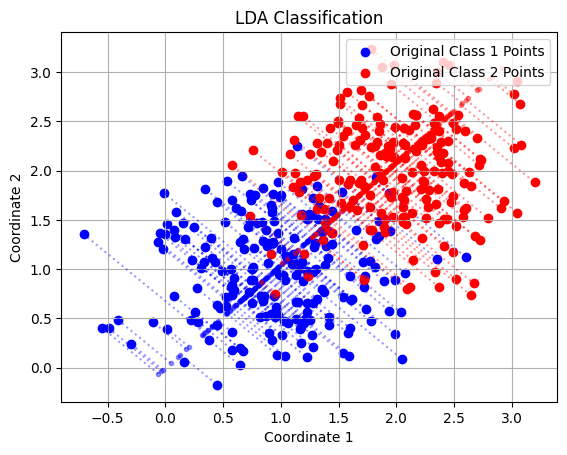

Accuracy with LDA: 91.0


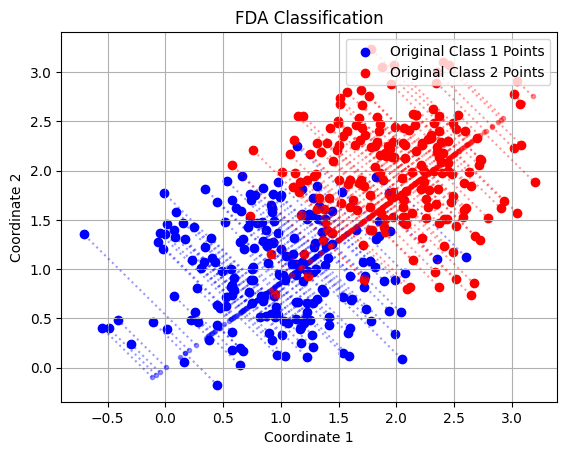

Accuracy with FDA: 91.5
Testing with covariance matrix 1: [[1, 0.5], [0.5, 1]]
Accuracy with LDA (covariance 1): 71.00%
Accuracy with FDA (covariance 1): 71.50%


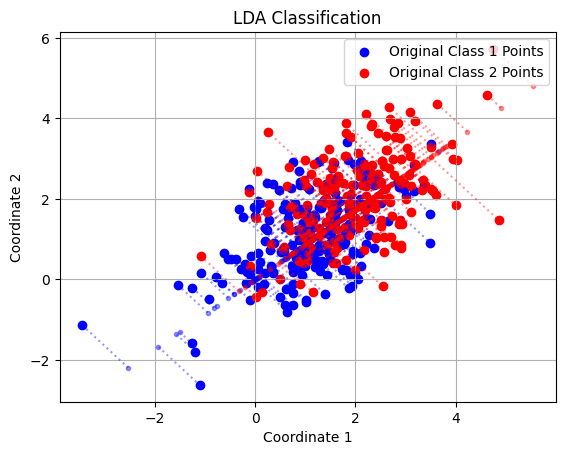

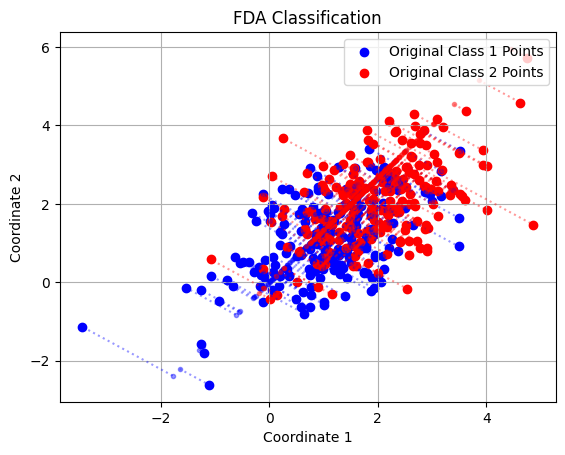

Testing with covariance matrix 2: [[0.8, 0.3], [0.3, 0.8]]
Accuracy with LDA (covariance 2): 72.50%
Accuracy with FDA (covariance 2): 72.25%


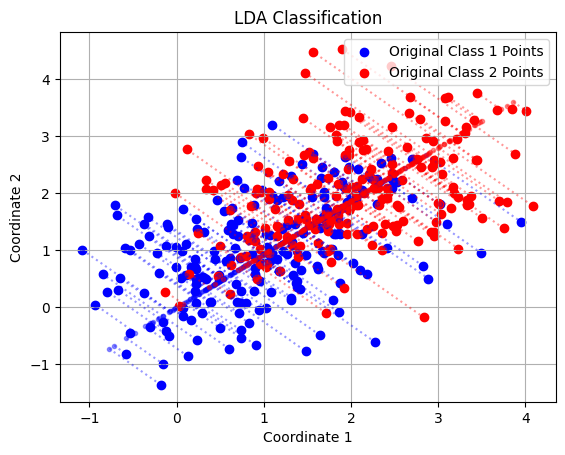

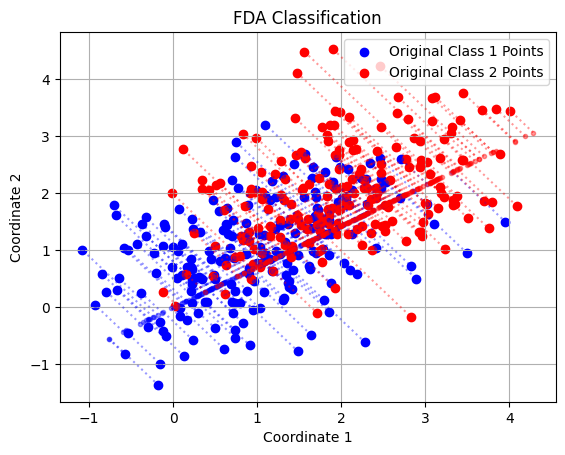

Testing with covariance matrix 3: [[9, 6], [6, 4]]
Accuracy with LDA (covariance 3): 59.25%
Accuracy with FDA (covariance 3): 100.00%


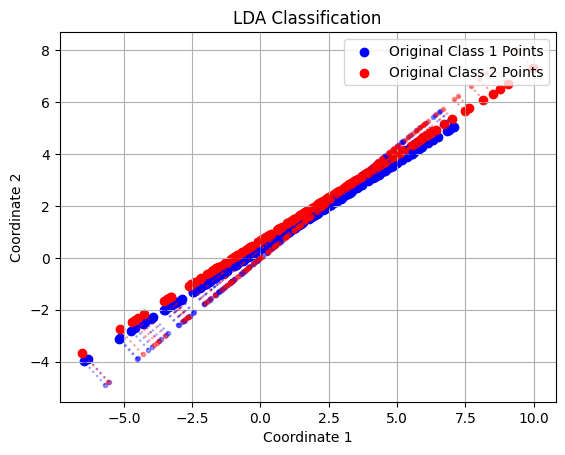

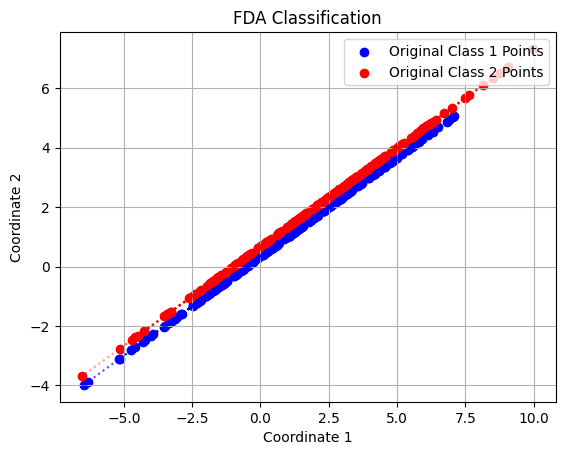

Testing with covariance matrix 4: [[1, 2], [2, 4]]
Accuracy with LDA (covariance 4): 62.25%
Accuracy with FDA (covariance 4): 100.00%


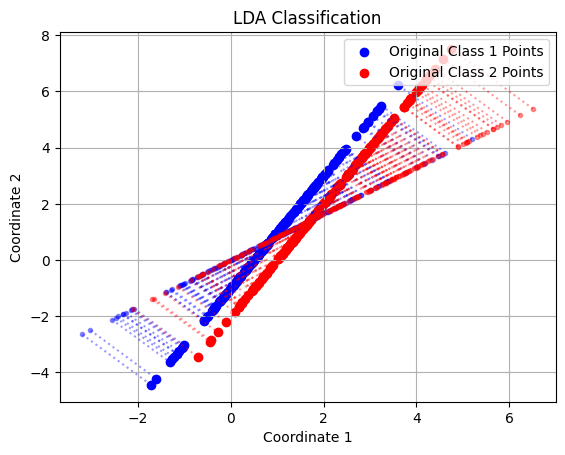

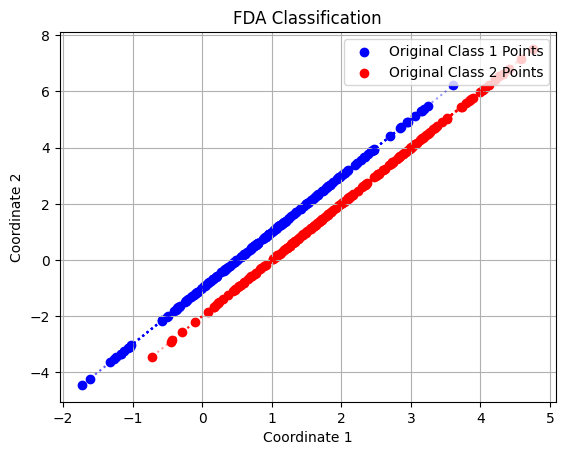

In [341]:
########################################
#Part-2)-(a): Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.repeat(np.array([0]), 50), np.repeat(np.array([1]), 50)))            #Class labels. Assign the value "0" to class1 and the value "1" to class2.
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([0]), 200), np.repeat(np.array([1]), 200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))

########################################
#Part-2)-(b)
########################################
#Complete the below function
def LDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Between class covariance

  class1_tr = np.empty((0, X_train.shape[1]))
  class2_tr = np.empty((0, X_train.shape[1]))

  for i in range(Y_train.shape[0]):
      if Y_train[i, 0] == 0:
          class1_tr = np.vstack((class1_tr, X_train[i, :]))
      else:
          class2_tr = np.vstack((class2_tr, X_train[i, :]))

  m1_tr = np.sum(class1_tr, axis = 0)
  m1_tr = np.reshape(m1_tr, (1, m1_tr.shape[0]))/class1_tr.shape[0]
  m2_tr = np.sum(class2_tr, axis = 0)
  m2_tr = np.reshape(m2_tr, (1, m2_tr.shape[0]))/class2_tr.shape[0]


  #Compute the weight vector

  w_opt = m1_tr - m2_tr
  w_opt = w_opt.T

  #Compute the threshold

  proj1 = np.dot(m1_tr,w_opt)
  proj2 = np.dot(m2_tr,w_opt)

  threshold = (proj1[0, 0] + proj2[0, 0])/2

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision

  projections = np.dot(X_test, w_opt) - threshold

  if proj1 - threshold > 0:
      predictions = (-1*np.sign(projections) + 1)/2
  else:
      predictions = (np.sign(projections) + 1)/2

  #Return weight vector and the predictions on testing data

  return predictions, w_opt

predictions, w = LDA_classify(tr_data, tr_targets, te_data)


def LDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels

  class1_original = np.empty((0, X_test.shape[1]))
  class2_original = np.empty((0, X_test.shape[1]))

  for i in range(Y_test.shape[0]):
      if Y_test[i, 0] == 0:
          class1_original = np.vstack((class1_original, X_test[i, :]))
      else:
          class2_original = np.vstack((class2_original, X_test[i, :]))

  plt.figure()
  plt.scatter(class1_original[:, 0], class1_original[:, 1], color='blue', label = "Original Class 1 Points")
  plt.scatter(class2_original[:, 0], class2_original[:, 1], color='red', label = "Original Class 2 Points")

  r = np.reshape(w, (2,))
  n2 = np.linalg.norm(r)**2

  # Finding the projection on w vector for each point (Credits to Saketh Ram for idea on plotting projections)
  for pt in class1_original:
      prj = r * np.dot(r, pt) / n2
      plt.plot([prj[0], pt[0]], [prj[1], pt[1]], 'b.:', alpha=0.4)
  for pt in class2_original:
      prj = r * np.dot(r, pt) / n2
      plt.plot([prj[0], pt[0]], [prj[1], pt[1]], 'r.:', alpha=0.4)

  plt.xlabel("Coordinate 1")
  plt.ylabel("Coordinate 2")
  plt.title("LDA Classification")
  plt.grid()
  plt.legend(loc = 'upper right')
  plt.show()

LDA_project(w, te_data, te_targets)

#Compute and print the accuracy
acc = LS_Classify_Accuracy(te_targets, predictions)

print('Accuracy with LDA:', acc*100)


########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Between class covariance

  class1_tr = np.empty((0, X_train.shape[1]))
  class2_tr = np.empty((0, X_train.shape[1]))

  for i in range(Y_train.shape[0]):
      if Y_train[i, 0] == 0:
          class1_tr = np.vstack((class1_tr, X_train[i, :]))
      else:
          class2_tr = np.vstack((class2_tr, X_train[i, :]))

  m1_tr = np.sum(class1_tr, axis = 0)
  m1_tr = np.reshape(m1_tr, (1, m1_tr.shape[0]))/class1_tr.shape[0]
  m2_tr = np.sum(class2_tr, axis = 0)
  m2_tr = np.reshape(m2_tr, (1, m2_tr.shape[0]))/class2_tr.shape[0]

  S_w1 = np.dot((class1_tr - m1_tr).T, class1_tr - m1_tr)
  S_w2 = np.dot((class2_tr - m2_tr).T, class2_tr - m2_tr)

  S_w = S_w1 + S_w2

  #Compute the weight vector

  w_opt = np.dot(np.linalg.inv(S_w), (m1_tr - m2_tr).T)

  #Compute the threshold

  proj1 = np.dot(m1_tr,w_opt)
  proj2 = np.dot(m2_tr,w_opt)

  threshold = (proj1[0, 0] + proj2[0, 0])/2

  #Project the data onto 1 dimensional space. Compare it with the threshold to make the decision

  projections = np.dot(X_test, w_opt) - threshold

  if proj1 - threshold > 0:
      predictions = (-1*np.sign(projections) + 1)/2
  else:
      predictions = (np.sign(projections) + 1)/2

  #Return weight vector and the predictions on testing data

  return w_opt, predictions

w, predictions = FDA_classify(tr_data, tr_targets, te_data)


def FDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels

  class1_original = np.empty((0, X_test.shape[1]))
  class2_original = np.empty((0, X_test.shape[1]))

  for i in range(Y_test.shape[0]):
      if Y_test[i, 0] == 0:
          class1_original = np.vstack((class1_original, X_test[i, :]))
      else:
          class2_original = np.vstack((class2_original, X_test[i, :]))

  #Plot the projections

  plt.figure()
  plt.scatter(class1_original[:, 0], class1_original[:, 1], color='blue', label = "Original Class 1 Points")
  plt.scatter(class2_original[:, 0], class2_original[:, 1], color='red', label = "Original Class 2 Points")

  r = np.reshape(w, (2,))
  n2 = np.linalg.norm(r)**2

  # Finding the projection on w vector for each point
  for pt in class1_original:
      prj = r * np.dot(r, pt) / n2
      plt.plot([prj[0], pt[0]], [prj[1], pt[1]], 'b.:', alpha=0.4)
  for pt in class2_original:
      prj = r * np.dot(r, pt) / n2
      plt.plot([prj[0], pt[0]], [prj[1], pt[1]], 'r.:', alpha=0.4)

  plt.xlabel("Coordinate 1")
  plt.ylabel("Coordinate 2")
  plt.title("FDA Classification")
  plt.grid()
  plt.legend(loc = 'upper right')
  plt.show()


FDA_project(w, te_data, te_targets)
#Compute and print the accuracy

acc = LS_Classify_Accuracy(te_targets, predictions)
print('Accuracy with FDA:', acc*100)

########################################
#Part-2)-(d)
########################################

# (No dataset to test on)

def FDA_project_K(X_train, Y_train, X_test, k):
  #Inputs: Training data, Training label, Testing data, and the number of eigen vectors to be considered
  #Oupur: Projection matrix
  num_classes = 9
  Classes = np.empty((num_classes, 0, X_train.shape[1]))
  for i in range(X_train.shape[0]):
      Classes[Y_train[i]] = np.vstack((Classes[Y_train[i]], X_train[i]))

  means = np.ones((num_classes, 1, X_train.shape[1]))
  for i in range(num_classes):
      means[i] = np.reshape(np.sum(Classes[i], axis = 0), (1, X_train.shape[1])) / Classes[i].shape[0]

  m_T = np.reshape(np.sum(X_train, axis = 0), (1, X_train.shape[1]))/X_train.shape[0]

  S_w = np.zeros((X_train.shape[1], X_train.shape[1]))
  for i in range(num_classes):
      delta_i = Classes[i].T - means[i]
      S_w += np.dot(delta_i, delta_i.T)

  delta = X_train.T - m_T
  S_t = np.dot(delta, delta.T)

  S_b = S_t - S_w

  eigen_val, eigen_vec = np.linalg.eigh(np.dot(np.linalg.inv(S_w), S_b))
  w = eigen_vec[:, eigen_vec.shape[1] - k:]

  #Compute and return the projection matrix
  return w




# Experiment with changing covariance matrix on accuracy comparison between LDA and FDA

# Define a series of covariance matrices to test
cov_matrices = [
    [[1, 0.5], [0.5, 1]],
    [[0.8, 0.3], [0.3, 0.8]],
    [[9,6], [6,4]],
    [[1,2],[2,4]]
]

# Iterate through each covariance matrix
for i, cov in enumerate(cov_matrices):
    print(f"Testing with covariance matrix {i + 1}: {cov}")

    # Generate new training data
    class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
    class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
    tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 and class2 training data
    tr_targets = np.concatenate((np.repeat(np.array([0]), 50), np.repeat(np.array([1]), 50)))  # Class labels
    tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

    # Generate new testing data
    class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
    class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
    te_data = np.vstack((class1_te, class2_te))  # Combine class1 and class2 testing data
    te_targets = np.concatenate((np.repeat(np.array([0]), 200), np.repeat(np.array([1]), 200)))  # Class labels
    te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))

    # Perform LDA classification
    predictions_lda, w_lda = LDA_classify(tr_data, tr_targets, te_data)
    acc_lda = LS_Classify_Accuracy(te_targets, predictions_lda)
    print(f'Accuracy with LDA (covariance {i + 1}): {acc_lda * 100:.2f}%')

    # Perform FDA classification
    w_fda, predictions_fda = FDA_classify(tr_data, tr_targets, te_data)
    acc_fda = LS_Classify_Accuracy(te_targets, predictions_fda)
    print(f'Accuracy with FDA (covariance {i + 1}): {acc_fda * 100:.2f}%')

    # Visualize LDA projections
    LDA_project(w_lda, te_data, te_targets)

    # Visualize FDA projections
    FDA_project(w_fda, te_data, te_targets)
## Experiment with changing covariance matrix on accuracy comparision between LDA and FDA




<b> Report your observations </b>

1. For the same dataset, the FDA generally performs better than the LDA, due to consideration of within class variance

2. LDA doesn't do very poorly here since within class covariance is not considerably large, and data is generally around the mean


3. **Experiment**: Comparing the variance of FDA and LDA by changing the covariance matrix  
    - **Observation**:  
      - For covariance matrices like `[[9, 6], [6, 4]]` and `[[1, 2], [2, 4]]`, LDA performed significantly worse compared to FDA.  
      - Interestingly, for covariance matrices like `[[0.8, 0.3], [0.3, 0.8]]` and others with each term less than 1, LDA performed on par with FDA.  

    - **Conclusion**:  
      1. FDA generally performs better, but LDA can perform very poorly when dimensions are highly correlated and have a larger spread (values > 1 in the covariance matrix).  
      2. For correlated dimensions with smaller spread (values < 1 in the covariance matrix), LDA can perform on par with FDA.  

    - **Theoretical Reason**:  
      - FDA considers within-class variance, which allows it to handle cases with larger or correlated spreads better than LDA.



<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


################### Perceptron ##################
Accuracy:  0.92
Decision Boundary: 85.37469068521541 * x1 + 78.16202872521814 * x2 + -227.73504604790526 = 1/2


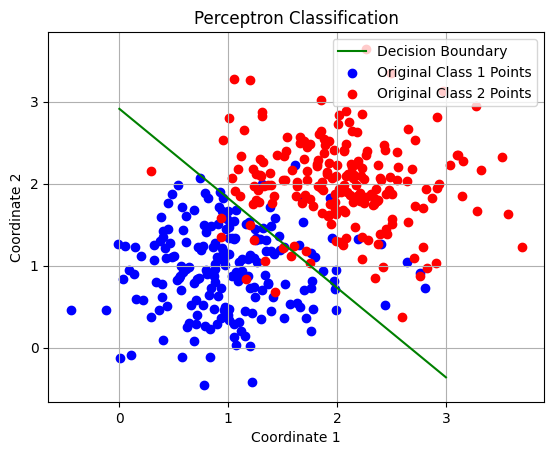

################### Least Squares ##################
Accuracy:  0.9225
Decision Boundary: 0.7390271401218347 * x1 + 0.7741767009348361 * x2 + -2.3446130171529056 = 1/2


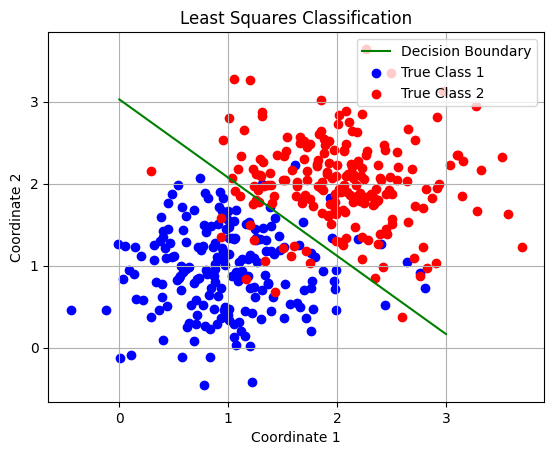

Introducing outliers to the data
Accuracy:  0.9225
Decision Boundary: 196.98086081514217 * x1 + 198.90121623513303 * x2 + -575.506415490494 = 1/2


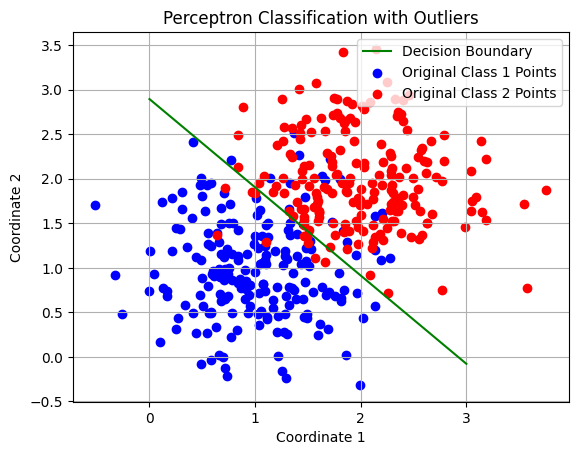

Accuracy:  0.76
Decision Boundary: 0.7390271401218347 * x1 + 0.7741767009348361 * x2 + -2.3446130171529056 = 1/2


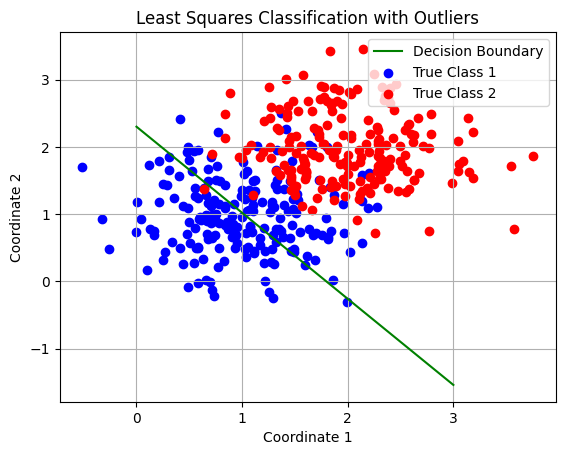

Accuracy:  0.4421052631578947
Decision Boundary: 0.7390271401218347 * x1 + 0.7741767009348361 * x2 + -2.3446130171529056 = 1/2


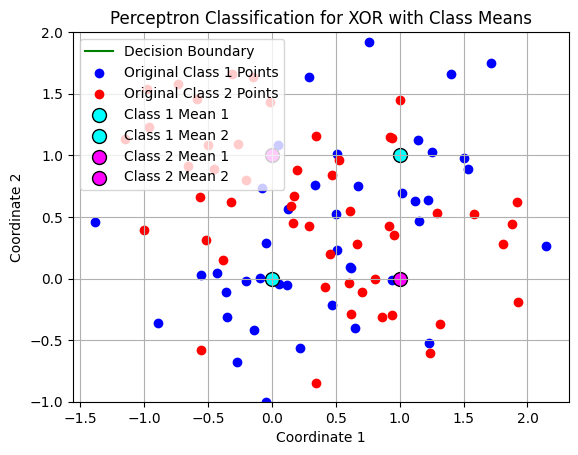

In [342]:
########################################
#Part-3)-(a): Data generation
########################################
# Considering -1 and +1

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.repeat(np.array([-1]), 50), np.repeat(np.array([1]), 50)))            #Class labels. Assign the value "0" to class1 and the value "1" to class2.
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([-1]), 200), np.repeat(np.array([1]), 200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))



########################################
#Part-3)-(b)
########################################
def Perceptron(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary

    epochs =   500  #Number of epochs
    X_train = np.hstack((np.ones((X_train.shape[0], 1)), X_train)) #Add a column of ones to the training data
    X_test = np.hstack((np.ones((X_test.shape[0], 1)), X_test))   #Add a column of ones to the testing data
    w = np.random.random((X_train.shape[1],1)) #Initialize the weight vector




    for epoch in range(0,epochs,1):
        #Compute the predictions

        predictions = X_train@w #Compute the predictions
        predictions[predictions >= 0] = 1
        predictions[predictions < 0] = -1
        predictions = predictions.reshape(-1, 1) #Reshape the predictions to be a column vector



      

        ##Loop through the training data and for eall the misclassified points, update the weight vector
        for i in range(X_train.shape[0]):
            if Y_train[i] != predictions[i]:
                #Update the weight vector
                w = w + X_train[i].reshape(-1, 1) * Y_train[i] #Update the weight vector





    #Compute the test data predicitions using the final weight vector

    predictions = X_test @ w #Compute the predictions
    predictions[predictions >= 0] = 1
    predictions[predictions < 0] = -1
    predictions = predictions.reshape(-1, 1) #Reshape the predictions to be a column vector


    #Return the test data predictions and the final weight vector
    return predictions, w





##########################################
#Plot the decision boundary using perceptron
##########################################
x_min, x_max = -1, 4 #X-axis limits



print("################### Perceptron ##################")

predictions, w_percep = Perceptron(tr_data, tr_targets, te_data) #Get the test data predictions
print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions)) #Print the accuracy of the model
print(f"Decision Boundary: {w_percep[1, 0]} * x1 + {w_percep[2, 0]} * x2 + {w_percep[0, 0]} = 1/2")





def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0])/w_pred[2]

x = np.linspace(0, 3, 100)

plt.plot(x, Prediction(x, w_percep), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Perceptron Classification")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()











##########################################
#Plot the decision boundary using least squares
##########################################

print("################### Least Squares ##################")

predictions, w_LS = LS_Classify(tr_data, tr_targets, te_data,1,-1) #Get the test data predictions
print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions)) #Print the accuracy of the model

print(f"Decision Boundary: {w_LS[1, 0]} * x1 + {w_LS[2, 0]} * x2 + {w_LS[0, 0]} = 1/2")


x = np.linspace(0, 3, 100)
plt.plot(x, Prediction(x, w_LS), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "True Class 1")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "True Class 2")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Least Squares Classification")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()






##########################################
#Part-3)-(c): Repeat the experiments with the true outliers added to the data. Compare and contrast the perceptron algorithm with least squares method
##########################################

print("Introducing outliers to the data")

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2
mean3 = [-100, -100]

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
class1_tr_out = np.random.multivariate_normal(mean3, cov, 10)
class1_tr = np.vstack((class1_tr, class1_tr_out))

tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.repeat(np.array([-1]), 60), np.repeat(np.array([1]), 50)))            #Class labels. Assign the value "0" to class1 and the value "1" to class2.
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([-1]), 200), np.repeat(np.array([1]), 200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))






##########################################
#Plot the decision boundary using perceptron
##########################################

predictions, w_percep = Perceptron(tr_data, tr_targets, te_data)
print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions)) #Print the accuracy of the model
print(f"Decision Boundary: {w_percep[1, 0]} * x1 + {w_percep[2, 0]} * x2 + {w_percep[0, 0]} = 1/2")


def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0])/w_pred[2]

x = np.linspace(0, 3, 100)

plt.plot(x, Prediction(x, w_percep), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Perceptron Classification with Outliers")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()


##########################################
#Plot the decision boundary using least squares
##########################################

predictions, w_ls = LS_Classify(tr_data, tr_targets, te_data,1,-1)
print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions)) #Print the accuracy of the model
print(f"Decision Boundary: {w_LS[1, 0]} * x1 + {w_LS[2, 0]} * x2 + {w_LS[0, 0]} = 1/2")


def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0])/w_pred[2]

x = np.linspace(0, 3, 100)


plt.plot(x, Prediction(x, w_ls), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "True Class 1")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "True Class 2")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Least Squares Classification with Outliers")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()



##########################################
#Part-3)-(d): Data generation XOR
##########################################

#Set the parameters of Gaussian distribution
class1_mean1 = [0, 0]     #Mean of Gaussian1
class1_mean2 = [1, 1]     #Mean of Gaussian3
class2_mean1 = [0, 1]     #Mean of Gaussian2
class2_mean2 = [1, 0]     #Mean of Gaussian4
cov = [[0.3, 0], [0, 0.3]]  #Covariance matrix. Same covariance for class1 and class2

#Generate  data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution

class1_data1 = np.random.multivariate_normal(class1_mean1, cov, 60)
class1_data2 = np.random.multivariate_normal(class1_mean2, cov, 60)
class2_data1 = np.random.multivariate_normal(class2_mean1, cov, 60)
class2_data2 = np.random.multivariate_normal(class2_mean2, cov, 60)

#Obtain 2-class dataset

tr_data = np.vstack((class1_data1, class1_data2, class2_data1, class2_data2))
tr_targets = np.concatenate((np.repeat(np.array([-1]), 120), np.repeat(np.array([1]), 120)))
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Create train test splits

data = np.hstack((tr_data, tr_targets))
np.random.shuffle(data)

train_data = data[:int(data.shape[0]*3/5)]
test_data = data[int(data.shape[0]*3/5) + 1:]

tr_data = train_data[:, :2]
tr_targets = train_data[:, 2]
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

te_data = test_data[:, :2]
te_targets = test_data[:, 2]
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))

class1_te = np.empty((0, 2))
class2_te = np.empty((0, 2))

for i in range(te_targets.shape[0]):
    if te_targets[i] == -1:
        class1_te = np.vstack((class1_te, te_data[i]))
    else:
        class2_te = np.vstack((class2_te, te_data[i]))

#Classify this dataset using perceptron algorithm

predictions, w_percep = Perceptron(tr_data, tr_targets, te_data)
print("Accuracy: ", LS_Classify_Accuracy(te_targets, predictions)) #Print the accuracy of the model
print(f"Decision Boundary: {w_LS[1, 0]} * x1 + {w_LS[2, 0]} * x2 + {w_LS[0, 0]} = 1/2")
#Plot the decision boundary
def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0])/w_pred[2]

x = np.linspace(-1, 2, 100)
plt.ylim(-1,2)

plt.plot(x, Prediction(x, w_percep), color='green', label="Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label="Original Class 1 Points")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label="Original Class 2 Points")

# Marking the means of the classes
plt.scatter(class1_mean1[0], class1_mean1[1], color='cyan', label="Class 1 Mean 1", edgecolor='black', s=100)
plt.scatter(class1_mean2[0], class1_mean2[1], color='cyan', label="Class 1 Mean 2", edgecolor='black', s=100)
plt.scatter(class2_mean1[0], class2_mean1[1], color='magenta', label="Class 2 Mean 1", edgecolor='black', s=100)
plt.scatter(class2_mean2[0], class2_mean2[1], color='magenta', label="Class 2 Mean 2", edgecolor='black', s=100)

plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Perceptron Classification for XOR with Class Means")
plt.grid()
plt.legend(loc='upper left')
plt.show()





### Observations and Experiments

1. **Experiment**: Comparing the performance of least squares and perceptron on almost linearly seperable dataset varying the number of epochs of perceptron
    - **Observation**: <br/>
            1.On varying epochs from 50,100,200,300,400,500 the resultant accuracy obtained were 83.5,87.75,88.88,88.75,88.25,88. We observe the on average perceptron obtained an accuracy of 88%. **Accuracy doesn't increase monontonically**<br/>
            2. While Least Squares Achieved an accuracy of 91.5 percent .<br/>
            3. Decision Boundary Obtained by both algorithms are different , though giving almost similar performance(88 approx vs 91 )<br/>

    - **Conclusion**: <br/>
            1. Accuracy doesn't increase montonically in percetron algorithm<br/>
            2. If datasets are not linearly seperable, perceptron algorithm will never converge <br/>
            3. Least Squares and Perceptron give similar performance.<br/>
    - **Theoretical Reason**: Key Idea <br/>

        The reason of non-monotonic increase in accuracy is inbuilt in perceptron algo itself .(Won't be there even if datasets are linearly seperable)


2. **Experiment**: Comparing the performance of least squares and perceptron on non-linearly seperable dataset with outliers(Introduced Outliers to class 1)
    - **Observation**: <br/>
     For data with outliers, perceptron performs much better with accuracy of approx 90 percent while least squares having accuracy of 50%.

    - **Conclusion**: <br/>
      Perceptron Algorithm is Robust to Outliers .

    - **Theoretical Reason**: Key Idea <br/>
     Since it doesn't consider the 'amount of correctness' of the training data points. Least squares is highly affected by outliers (Squared Error)




3. **Experiment**: **XOR Problem** Applying Perceptron Algorithm on one of the most basic non-linearly seperable dataset 
    - **Observation**: <br/>
     Perceptron performs too poorly with a accuracy of  around 50% .

    - **Conclusion**: <br/>
      Perceptron Algorithm won't converge for non-linearly seperable dataset and will perform very poorly

    - **Theoretical Reason**: Key Idea <br/>
     Perceptron Convergence Theorem says for convergence in linearly seperable dataset. Not in Non Linearly Seperable Dataset










   




<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




In [343]:
def generate_data(mean1, mean2, cov, n_train=50, n_test=200):
    np.random.seed(0)
    X1 = np.random.multivariate_normal(mean1, cov, n_test)
    X2 = np.random.multivariate_normal(mean2, cov, n_test)
    Y1 = np.zeros(n_test)
    Y2 = np.ones(n_test)
    X = np.vstack((X1, X2))
    Y = np.hstack((Y1, Y2))
    return X, Y

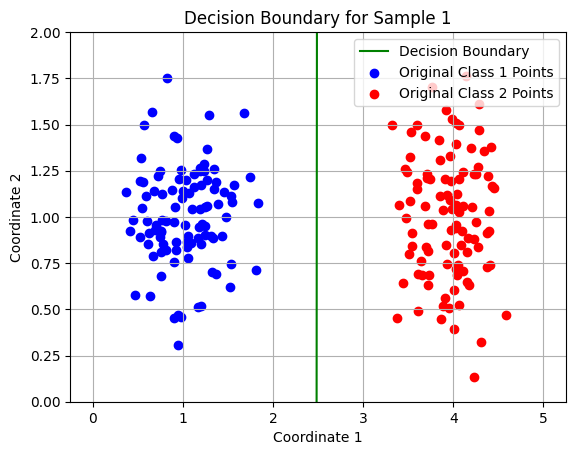

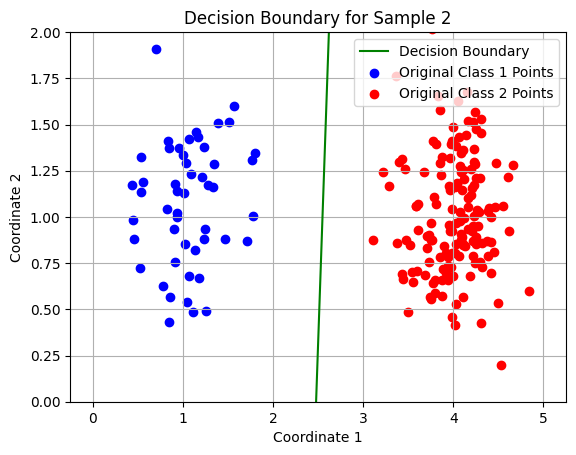

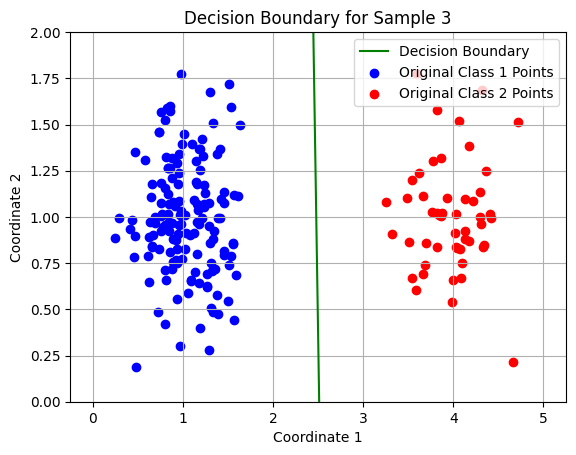

In [344]:
##########################################
#Part-4a)-0: Data Generation
##########################################
m1 = [1, 1]
m2 = [4, 1]
cov = [[0.1, 0], [0, 0.1]]

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s1 = np.random.multivariate_normal(m1, cov, 100)
class2_s1 = np.random.multivariate_normal(m2, cov, 100)
data_1 = np.vstack((class1_s1, class2_s1))
targets_1 = np.concatenate((np.repeat(np.array([-1]), 100), np.repeat(np.array([1]), 100)))
targets_1 = np.reshape(targets_1, (targets_1.shape[0], 1))

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s2 = np.random.multivariate_normal(m1, cov, 50)
class2_s2 = np.random.multivariate_normal(m2, cov, 150)
data_2 = np.vstack((class1_s2, class2_s2))
targets_2 = np.concatenate((np.repeat(np.array([-1]), 50), np.repeat(np.array([1]), 150)))
targets_2 = np.reshape(targets_2, (targets_2.shape[0], 1))

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s3 = np.random.multivariate_normal(m1, cov, 150)
class2_s3 = np.random.multivariate_normal(m2, cov, 50)
data_3 = np.vstack((class1_s3, class2_s3))
targets_3 = np.concatenate((np.repeat(np.array([-1]), 150), np.repeat(np.array([1]), 50)))
targets_3 = np.reshape(targets_3, (targets_3.shape[0], 1))

##########################################
#Part-4a)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function
def decisionBoundary(X_train, Y_train):
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., w0, w
    p_c1 = np.count_nonzero(Y_train == 1)/Y_train.shape[0]
    p_c2 = 1. - p_c1

    data = np.hstack((X_train, Y_train))

    data_class1 = (data[data[:, 2]==-1]) [:, :2]
    data_class2 = (data[data[:, 2]==1]) [:, :2]
    mean_1 = np.sum(data_class1, axis = 0)
    mean_1 = (mean_1/data_class1.shape[0])[:2]
    mean_1 = np.reshape(mean_1, (mean_1.shape[0], 1))

    mean_2 = np.sum(data_class2, axis = 0)
    mean_2 = (mean_2/data_class2.shape[0])[:2]
    mean_2 = np.reshape(mean_2, (mean_2.shape[0], 1))

    cov1 = np.dot(data_class1.T - mean_1, (data_class1.T - mean_1).T) / data_class1.shape[0]
    cov2 = np.dot(data_class2.T - mean_2, (data_class2.T - mean_2).T) / data_class2.shape[0]

    cov = (cov1*data_class1.shape[0] + cov2*data_class2.shape[0])/2/data.shape[0]

    w = np.dot(np.linalg.inv(cov), mean_1 - mean_2)
    w0 = -0.5*np.dot(mean_1.T, np.dot(np.linalg.inv(cov), mean_1)) + 0.5*np.dot(mean_2.T, np.dot(np.linalg.inv(cov), mean_2)) + np.log(p_c1/p_c2)
    w0 = np.reshape(w0, (1, 1))
    w = np.vstack((w0, w))

    return w

#Plot the decision regions
def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0])/w_pred[2]

w_s1 = decisionBoundary(data_1, targets_1)

x = np.linspace(0, 5, 100)

plt.plot(x, Prediction(x, w_s1), color='green', label = "Decision Boundary")
plt.scatter(class1_s1[:, 0], class1_s1[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_s1[:, 0], class2_s1[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Decision Boundary for Sample 1")
plt.grid()
plt.legend(loc = 'upper right')
plt.ylim(0, 2)
plt.show()


w_s2 = decisionBoundary(data_2, targets_2)

x = np.linspace(0, 5, 100)

plt.plot(x, Prediction(x, w_s2), color='green', label = "Decision Boundary")
plt.scatter(class1_s2[:, 0], class1_s2[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_s2[:, 0], class2_s2[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Decision Boundary for Sample 2")
plt.grid()
plt.legend(loc = 'upper right')
plt.ylim(0, 2)
plt.show()

w_s3 = decisionBoundary(data_3, targets_3)

x = np.linspace(0, 5, 100)

plt.plot(x, Prediction(x, w_s3), color='green', label = "Decision Boundary")
plt.scatter(class1_s3[:, 0], class1_s3[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_s3[:, 0], class2_s3[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Decision Boundary for Sample 3")
plt.grid()
plt.legend(loc = 'upper right')
plt.ylim(0, 2)
plt.show()

1. **Experiment**: MAP with same covariance matrix 
    - **Observation**:Decision Boundary is Linear  
    - **Conclusion**: Decision Boundary is Linear incase of MAP with gaussian priors with same covariance matrix
    - **Theoretical Reason**:If the underlying decison boundary is gaussian , the quadratic terms cancel out . 

2. **Experiment**: Effect of Priors on Decision Boundary of MAP with same covariance matrix 
    - **Observation**:Decision Boundary Shifts away from class with higher prior  
    - **Conclusion**: Priors effect the decision boundary and decision boundary shifts away from class with higer priors(giving more space :))
    - **Theoretical Reason**:The decision boundary is:

$
x^T W + w_0 = 0
$

Where:

$
W = \Sigma^{-1}(\mu_1 - \mu_2), \quad w_0 = -\tfrac{1}{2} \mu_1^T \Sigma^{-1} \mu_1 + \tfrac{1}{2} \mu_2^T \Sigma^{-1} \mu_2 + \log\left( \frac{p(c_1)}{p(c_2)} \right)
$

In 2D:

$
W = \begin{bmatrix} w_1 \\ w_2 \end{bmatrix}, \quad x = \begin{bmatrix} x_1 \\ x_2 \end{bmatrix}
$

Set \( x_2 = 0 \) to get x-intercept:

$
x_1 = -\frac{w_0}{w_1}
$

Since \( w_0 \) depends on the log prior ratio:

- Increasing  p(c_1) $\Rightarrow w_0 \uparrow \Rightarrow x_1$  shifts left  
- Decreasing  p(c_1) $\Rightarrow w_0 \downarrow \Rightarrow x_1$ shifts right

👉 The boundary shifts toward the less probable class to account for prior imbalance.. 


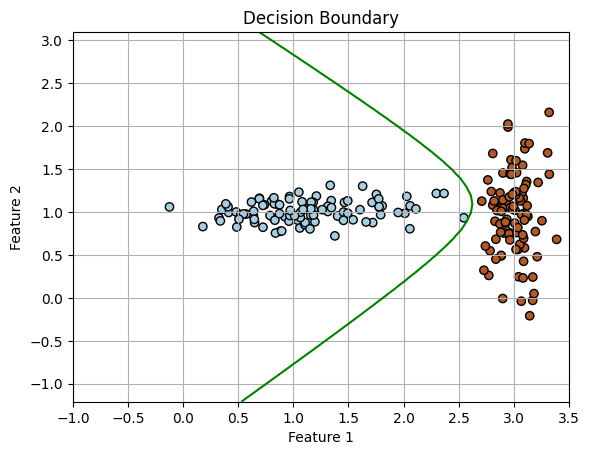

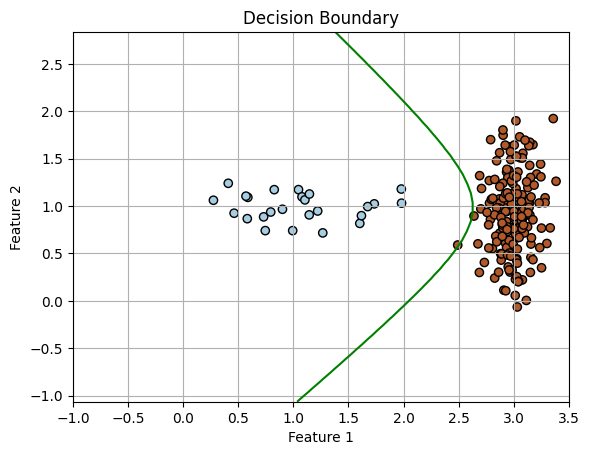

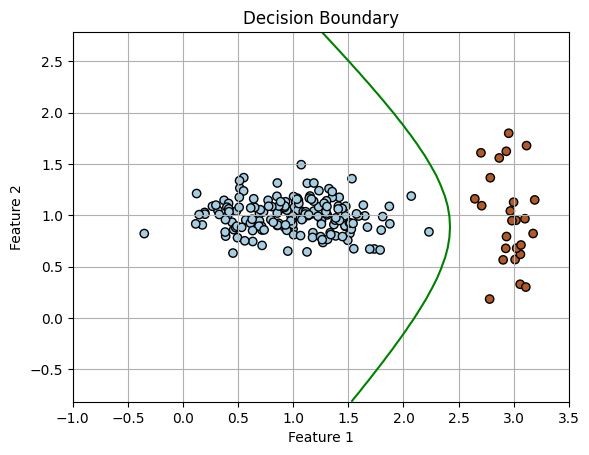

In [345]:
# Remaining: observations

##########################################
#Part-4b)-0: Data Generation
##########################################
m1 = np.array([1, 1])
m2 = np.array([3, 1])
cov1 = np.array([[0.2, 0], [0, 0.02]])
cov2 = np.array([[0.02, 0], [0, 0.2]])

#Case1: Generate 100 samples from each class. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s1 = np.random.multivariate_normal(m1, cov1, 100)
class2_s1 = np.random.multivariate_normal(m2, cov2, 100)
data_1 = np.vstack((class1_s1, class2_s1))
targets_1 = np.concatenate((np.repeat(np.array([-1]), 100), np.repeat(np.array([1]), 100)))
targets_1 = np.reshape(targets_1, (targets_1.shape[0], 1))

#Case2: Generate 50 samples from class1 and 150 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s2 = np.random.multivariate_normal(m1, cov1, 25)
class2_s2 = np.random.multivariate_normal(m2, cov2, 175)
data_2 = np.vstack((class1_s2, class2_s2))
targets_2 = np.concatenate((np.repeat(np.array([-1]), 25), np.repeat(np.array([1]), 175)))
targets_2 = np.reshape(targets_2, (targets_2.shape[0], 1))

#Case3: Generate 150 samples from class1 and 50 samples from class2. You may use "np.random.multivariate_normal()" function to sample data points of multi-variate Gaussian distribution
class1_s3 = np.random.multivariate_normal(m1, cov1, 175)
class2_s3 = np.random.multivariate_normal(m2, cov2, 25)
data_3 = np.vstack((class1_s3, class2_s3))
targets_3 = np.concatenate((np.repeat(np.array([-1]), 175), np.repeat(np.array([1]), 25)))
targets_3 = np.reshape(targets_3, (targets_3.shape[0], 1))

##########################################
#Part-4b)-4: Plot the decision regions for all the three cases
##########################################
#Complete the below function

def multivariate_gaussian(input, mean, cov_inv):
    likelihoods = []
    for i in range(input.shape[0]):
        inp_i = np.reshape(input[i, :].T, (2, 1))

        likelihoods.append(np.log((np.linalg.norm(cov_inv))**(0.5) * np.exp(-0.5*np.dot((inp_i-mean).T, np.dot(cov_inv, inp_i-mean)))[0, 0]))

    return np.asarray(likelihoods)


# For the given data, plotting the decision boundary
def decisionBoundary(X_train, Y_train):
    # Inputs: Training data and Training labels
    # Outputs: Decision boundary parameters, i.e., w0, w

    p_c1 = np.count_nonzero(Y_train == 1) / Y_train.shape[0]
    p_c2 = 1. - p_c1

    data = np.hstack((X_train, Y_train))

    data_class1 = data[data[:, 2] == -1][:, :2]
    data_class2 = data[data[:, 2] == 1][:, :2]

    mean_1 = np.mean(data_class1, axis=0)[:2]
    mean_1 = mean_1.reshape(-1, 1)

    mean_2 = np.mean(data_class2, axis=0)[:2]
    mean_2 = mean_2.reshape(-1, 1)

    cov1 = np.cov(data_class1.T)
    cov2 = np.cov(data_class2.T)

    # Generate mesh grid
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1))
    grid = np.c_[xx.ravel(), yy.ravel()]

    # Compute posterior probabilities
    posterior1 = multivariate_gaussian(grid, mean_1, np.linalg.inv(cov1)) + np.log(p_c1)
    posterior2 = multivariate_gaussian(grid, mean_2, np.linalg.inv(cov2)) + np.log(p_c2)

    # Find points where posterior1 = posterior2
    equal_posterior_points = grid[np.isclose(posterior1, posterior2, atol=2.5)]

    # Plot data points and decision boundary
    plt.scatter(X_train[:, 0], X_train[:, 1], c=Y_train, cmap=plt.cm.Paired, edgecolors='k')
    plt.contour(xx, yy, (posterior1 - posterior2).reshape(xx.shape), levels=[0], colors='green', linestyles='solid')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.xlim((-1, 3.5))
    plt.grid()
    plt.title('Decision Boundary')
    plt.show()


decisionBoundary(data_1, targets_1)
decisionBoundary(data_2, targets_2)
decisionBoundary(data_3, targets_3)


<b> Report your observations </b>

1. MAP with unequal covariance leads to quadratic (curved) decision surfaces.

2. **Experiment**: Effect of Priors on Decision Boundary of MAP with different covariance matrix (with 150, 50 and 25, 175)  
    - **Observation**:  
        1. Decision Boundary shifts away from the class with higher prior (observed by examining the X1 intercept and the top part of the curve).  
        2. The bell curve tip doesn't appreciably change.  

    - **Conclusion**:  
        1. Priors affect the decision boundary, and the decision boundary shifts away from the class with higher priors (giving more space).  
        2. No reasonable conclusion or explanation was found for the above; it may just be a random effect for this particular dataset.  




<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 93.0 




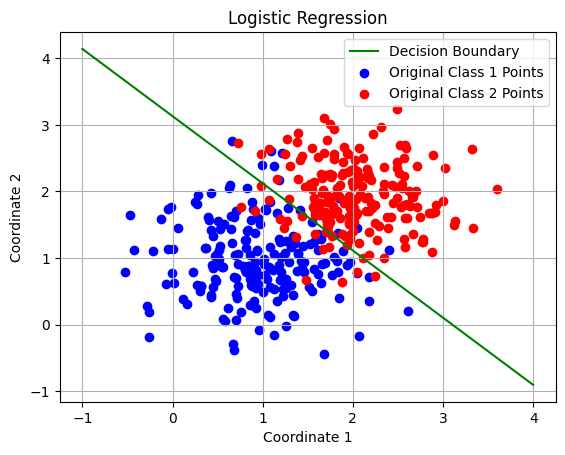



 Accuracy with Logistic Regression: 91.25 




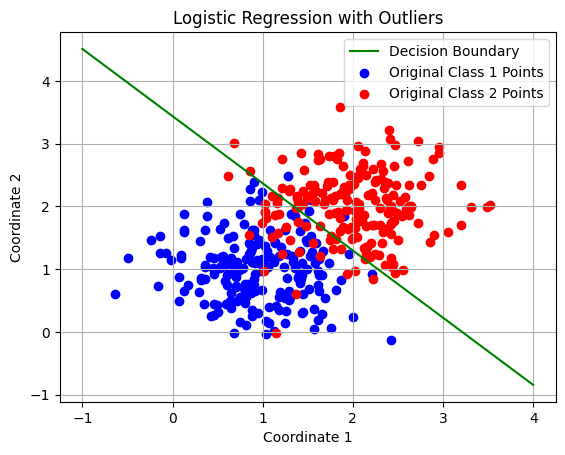



 Accuracy with Least Squares Classification: 50.24999999999999 




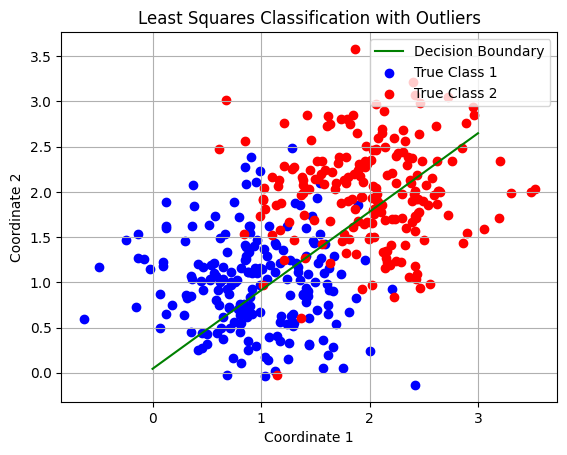

In [346]:
##################################################
#Part-5)-1: Data generation
##################################################



#Set the parameters of class distribution
mean1 = [1, 1]           #Mean of class1
mean2 = [2, 2]           #Mean of class2
cov = [[0.3, 0], [0, 0.3]] #Covariance matrix. Same covariance for class1 and class2

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.repeat(np.array([0]), 50), np.repeat(np.array([1]), 50)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([0]), 200), np.repeat(np.array([1]), 200)))           #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))



##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################

def sigmoid(a):
    a = np.clip(a, -750, 750)
    return 1/(1+np.exp(-a))



## We are not checking training accuracy here. We are only checking the test accuracy ## To DO

def Logistic_Regression(X_train, Y_train, X_test):
  #Inputs: Training data, Training labels, and Testing data
  #Outputs: Predictions on test data

  max_iter =  100 #max number of ierations for parameter update
  threshold = 0.5 #threshold for classification
  X =   np.hstack((np.ones((X_train.shape[0], 1)), X_train))        #Data. Append ones to the training data to take care of the bias
  w =   np.zeros((X.shape[1], 1))       #Initialize the weight vector



  for iter in range(0,max_iter,1):
    preds =  sigmoid(np.dot(X, w)[:])  #Predictions on X. Sigmoid(w^T.x)
    error =   preds - Y_train  #Difference between preds and Y_train

    #Compute the gradients and the appropriate learning rate. We can use Hessian matrix as learning rate
    R = np.diag(np.multiply(preds, 1 - preds)[:, 0])
    hessian = np.dot(X.T, np.dot(R, X))
    grad = np.dot(X.T, error)



    #Update the weight vector
    try:
      change = np.dot(np.linalg.inv(hessian), grad)
    except np.linalg.LinAlgError:
      change = np.dot(np.linalg.inv(hessian + 1e-4*np.eye(hessian.shape[0])), grad)

    w = w - change


  #Test data predictions
  X_te = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
  test_preds = sigmoid(np.dot(X_te, w)[:])


  #Compare the predictions with 0, to output the decision
  test_preds = (test_preds >= threshold).astype(int)



  #Return the predicted test labels
  return test_preds,w


Y_pred,w_opt = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted lables of test data
  #Outputs: Accuracy

  acc = np.mean(Y_pred == Y_test)

  #Compute and return the accuracy
  return acc*100


acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
#Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################


def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0] - 0.5)/w_pred[2]

x = np.linspace(-1, 4, 100)

plt.plot(x, Prediction(x, w_opt), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Logistic Regression")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()







##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################





#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2
mean3 = [-100, -100]

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr = np.random.multivariate_normal(mean1, cov, 50)            #Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)            #Class2 training data
class1_tr_out = np.random.multivariate_normal(mean3, cov, 10)
class1_tr = np.vstack((class1_tr, class1_tr_out))

tr_data = np.vstack((class1_tr, class2_tr))              #Combine class1 training and class2 training data to get total training data
tr_targets = np.concatenate((np.repeat(np.array([0]), 60), np.repeat(np.array([1]), 50)))            #Class labels. Assign the value "0" to class1 and the value "1" to class2.
tr_targets = np.reshape(tr_targets, (tr_targets.shape[0], 1))

#Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)            #Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)            #Class2 testing data
te_data = np.vstack((class1_te, class2_te))              #Combine class1 testing and class2 testing data to get total testing data
te_targets = np.concatenate((np.repeat(np.array([0]), 200), np.repeat(np.array([1]), 200)))          #Class labels. Assign the value "0" to class1 and the value "1" to class2.
te_targets = np.reshape(te_targets, (te_targets.shape[0], 1))

Y_pred, w_opt= Logistic_Regression(tr_data, tr_targets, te_data)

acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')

def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0] - 0.5)/w_pred[2]

x = np.linspace(-1, 4, 100)

plt.plot(x, Prediction(x, w_opt), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "Original Class 1 Points")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "Original Class 2 Points")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Logistic Regression with Outliers")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()

##########################################
#Plot the decision boundary using least squares
##########################################

predictions, w_ls = LS_Classify(tr_data, tr_targets, te_data,1,0)

acc = LR_Accuracy(predictions, Y_pred)
print('\n\n Accuracy with Least Squares Classification:', acc, '\n\n')


def Prediction(x, w_pred):
    return -(w_pred[1]*x + w_pred[0] - 0.5)/w_pred[2]

x = np.linspace(0, 3, 100)


plt.plot(x, Prediction(x, w_ls), color='green', label = "Decision Boundary")
plt.scatter(class1_te[:, 0], class1_te[:, 1], color='blue', label = "True Class 1")
plt.scatter(class2_te[:, 0], class2_te[:, 1], color='red', label = "True Class 2")
plt.xlabel("Coordinate 1")
plt.ylabel("Coordinate 2")
plt.title("Least Squares Classification with Outliers")
plt.grid()
plt.legend(loc = 'upper right')
plt.show()





### Observations and Experiments

1. **Experiment**: Tested classification on two classes having underlying Gaussian distribution with different means but the same covariance matrix.  
    - **Observation**: Achieved close to 90% accuracy.  
    - **Conclusion**: Logistic Regression performs binary classification effectively with high accuracy.  
    - **Theoretical Reason**: Logistic Regression models the probability of class membership using a sigmoid function, which works well for linearly separable data.

2. **Experiment**: Introduced 10 outliers sampled from a multivariate Gaussian distribution centered at (-100, -100) with the same covariance matrix. Compared the results of Logistic Regression with Least Squares.  
    - **Observation**:  
      - Logistic Regression was unaffected by outliers and achieved a similar accuracy of close to 90%.  
      - Least Squares performed poorly, with accuracy dropping to 60%.  
    - **Conclusion**: Logistic Regression is robust to outliers, whereas Least Squares is sensitive to them.  
    - **Theoretical Reason**: Logistic Regression minimizes the log-loss function, which is less sensitive to extreme values, while Least Squares minimizes the squared error, making it more prone to being influenced by outliers.<br/>
    Decision boundary is influenced by likelihood, not raw distance <br/>
    $J(\mathbf{w}) = \mathbf{X}^T (\mathbf{y} - \mathbf{t})$ for logistic regression which is also similar to least squares. 
    Outliers often get low weights in gradient updates <br/>
    During training, points with:<br/>

    High confidence (p close to 1 or 0) ⇒ low gradient<br/>

    Ambiguous classification (p near 0.5) ⇒ high gradient<br/>














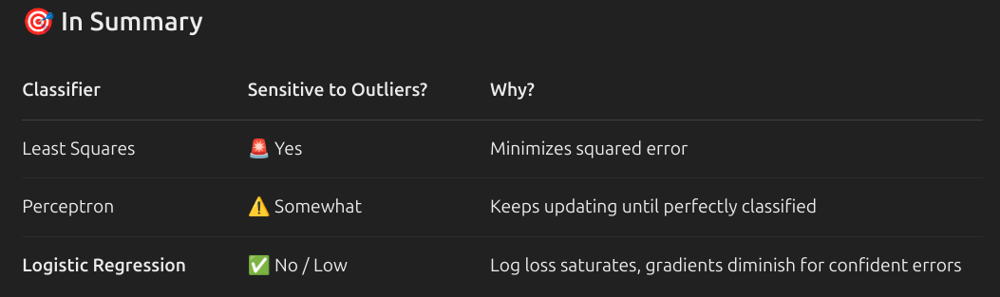

<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


<dt> <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data. </dt>


<dt>  1. Let us consider the GMM with Bivariate Gaussians   </dt>
<dd>  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this assignment.  </dd>
<br>
<dd>  
<center> 
$\pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix}$ 
</center>   
</dd>
<br>
<dd>  
<center> 
$\Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}$  
</center>  
</dd>
<br>
<dd>  
<center> 
$\Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$  
</center>  
</dd>
<br>
<dd>  
<center> 
$\Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$  
</center>  
</dd>

<dd>  - Pick one Gaussian following the selection probability as  $\pi$    </dd>
<dd>  - Sample the data point from the selected Bivariate Gaussian distribution    </dd>
<dd>  - Repeat the process N times to get the entire data set  </dd>
<dt>  2. Create the synthetic data set with the number of mixtures as 2.  </dt>
<dt>  3. Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM. </dt> </dd>

<dt> <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM). </dt>  

<dt>  1. Choose the number of mixtures (M) and initialize the parameters of the GMM model.  </dt>
<dd>  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  </dd>

<dt>   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here $k$ indicates the Gaussian in GMM.  </dt>
<br>

<dd>  
<center> 
$\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} \mid \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( \textbf{x}_{n} \mid \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; \forall \;\;k=1,2,...,M \;\; \text{and} \;\; n=1,2,...,N$  
</center>  
</dd>

<br>

<dd>   Where $N$ is the total number of data points and $M$ is the total number of Gaussians in GMM.   </dd>

<dd>   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point.   </dd>

<dd>   - $\sum_{n=1}^{N} \gamma_{nk}$ represents the effective number of data points generated by $k^{th}$ Gaussian.   </dd>


<dt>   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current responsibilities ($\gamma_{nk}$) by maximizing the likelihood. </dt>

<dd>
 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k} = \sum_{n=1}^{N} \gamma_{nk}$   
 </dd>

<dd>
 - Mean of $k^{th}$ Gaussian : $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} \textbf{x}_{n}$   
 </dd>

<dd>
 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( \textbf{x}_{n} - \hat{\mu_{k}} )( \textbf{x}_{n} - \hat{\mu_{k}} )^{T}$   
 </dd>

<dd>
 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 </dd>

<dt>  4. Compute the log-likelihood with the updated parameters.  </dt>
<dt>   5. Repeat the expectation and maximization steps until convergence.  </dt>

<dt>  <b> c. Illustration of EM iterations </b>  </dt>

<dt>   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  </dt>

<dt>  <b> d. Understanding the issues with EM algorithm </b>  </dt>
<dt>   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  </dt>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section.    </dd>
<dt>   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality. </dt>
<dd>   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal, and Full covariance.  </dd>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section.  </dd>


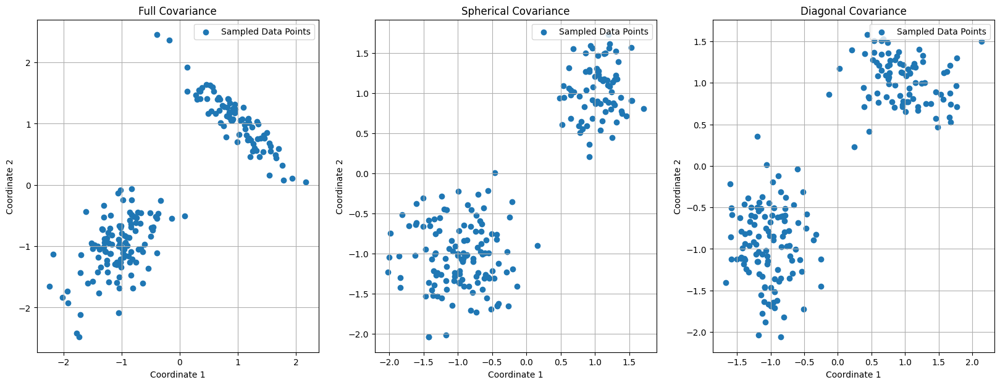

In [347]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu, sigma, N):
    ############################################################################
    #pi = weights of Gaussians, mu = mean of Gaussians, sigma = convariance of Gaussians, N = number of data points
    #Steps
    #1.Select th Gaussian following the probability distribution as pi
    #2.Sample the data points from the selected Gaussian
    #3.Repeat the process N times to get N data points
    #4.Return the sampled data
    ############################################################################
    #You may look into "random.choices" and "np.random.multivariate_normal" functions


    choices = np.random.binomial(1, pi[0], N)
    N1 = np.count_nonzero(choices==1)
    N2 = N - N1
    type1_data = np.random.multivariate_normal(np.reshape(mu[0], (2,)), sigma[0], N1)
    type2_data = np.random.multivariate_normal(np.reshape(mu[1], (2,)), sigma[1], N2)

    data = np.vstack((type1_data, type2_data))
    labels = np.concatenate((np.repeat(np.array([0]), N1), np.repeat(np.array([1]), N2)))

   



    return np.asarray(data), np.asarray(labels)
    ############################################################################






############################################################################
#Chose the appropriate means ($\mu$), covariances ($\Sigma$), and weights
############################################################################
mu1 = np.array([-1.0, -1.0])   #Mean vector of component1 in GMM
mu1 = np.reshape(mu1, (mu1.shape[0], 1))
sig1 = [[0.15, 0.1], [0.1, 0.25]]  #Full covariance matrix of component1 in GMM
mu2 = np.array([1, 1])   #Mean vector of component2 in GMM
mu2 = np.reshape(mu2, (mu2.shape[0], 1))
sig2 = [[0.3, -0.25], [-0.25, 0.25]]  #Full covariance matrix of component2 in GMM
pi = [0.6, 0.4]    #Prior probabilities

n_points = 200 #Number of points

# Spherical covariances
sig1_s = [[0.2, 0], [0, 0.2]]
sig2_s = [[0.1, 0], [0, 0.1]]
# Diagonal covariances
sig1_d = [[0.1, 0], [0, 0.2]]
sig2_d = [[0.2, 0], [0, 0.1]]

############################################################################
#Create the synthetic data set
############################################################################

data_full, labels_full = generateData(pi, [mu1, mu2], [sig1, sig2], 200)
data_sp, labels_sp = generateData(pi, [mu1, mu2], [sig1_s, sig2_s], 200)
data_dg, labels_dg = generateData(pi, [mu1, mu2], [sig1_d, sig2_d], 200)

############################################################################
#Plot the synthetic data set
############################################################################

fig, ax = plt.subplots(1,3, figsize=(20,7))

ax[0].set_title('Full Covariance')
ax[0].scatter(data_full[:, 0], data_full[:, 1], label = 'Sampled Data Points')

ax[0].set_xlabel("Coordinate 1")
ax[0].set_ylabel("Coordinate 2")

ax[0].grid()
ax[0].legend(loc = 'upper right')

#Visualize the data sampled from the GMM with spherical covariance matrix
ax[1].set_title('Spherical Covariance')
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], label = 'Sampled Data Points')

ax[1].set_xlabel("Coordinate 1")
ax[1].set_ylabel("Coordinate 2")

ax[1].grid()
ax[1].legend(loc = 'upper right')

#Visualize the data sampled from the GMM with diagonal covariance matrix
ax[2].set_title('Diagonal Covariance')
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], label = 'Sampled Data Points')

ax[2].set_xlabel("Coordinate 1")
ax[2].set_ylabel("Coordinate 2")

ax[2].grid()
ax[2].legend(loc = 'upper right')


plt.show()


Iteration Number:0
Current Likelihood: -602.7924693633265


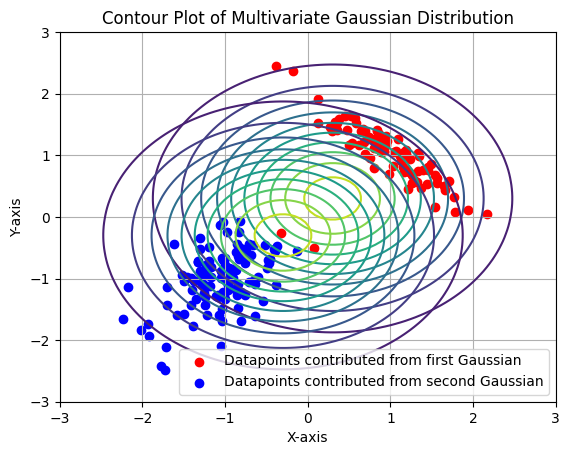

Iteration Number:1
Current Likelihood: -719.7538957162355


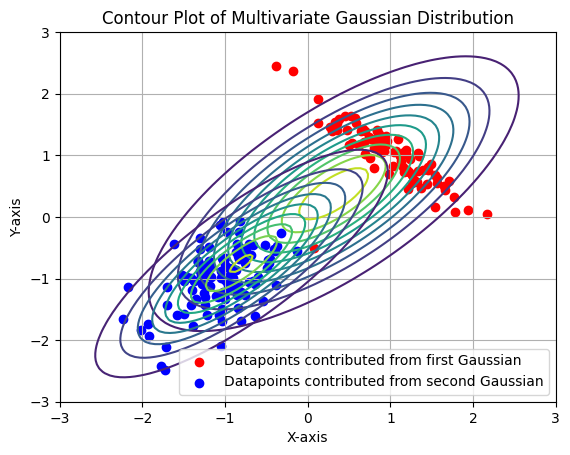

Iteration Number:2
Current Likelihood: -716.5658339330814


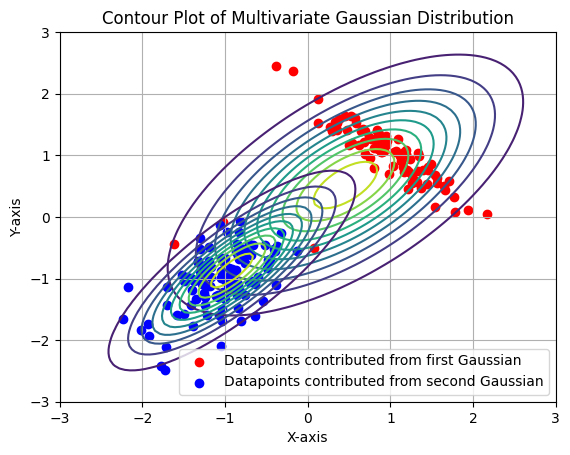

Iteration Number:3
Current Likelihood: -731.8983217962987


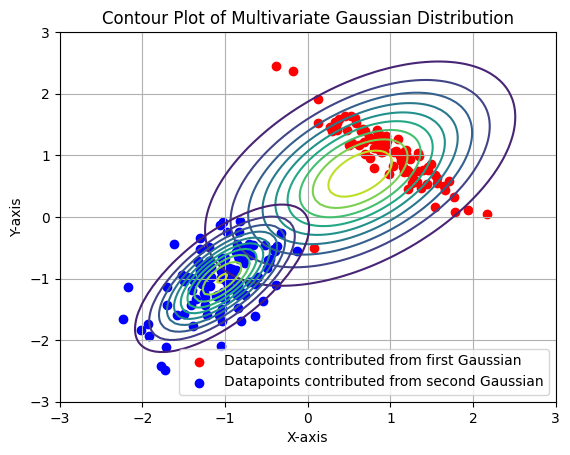

Iteration Number:4
Current Likelihood: -749.3208814105221


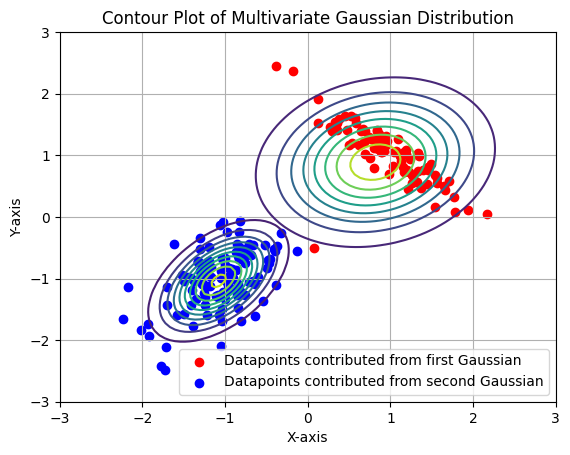

Iteration Number:5
Current Likelihood: -781.8411976309014


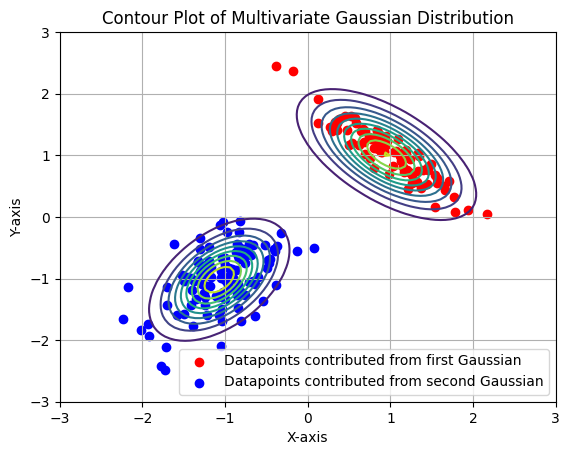

Iteration Number:6
Current Likelihood: -843.8026009129856


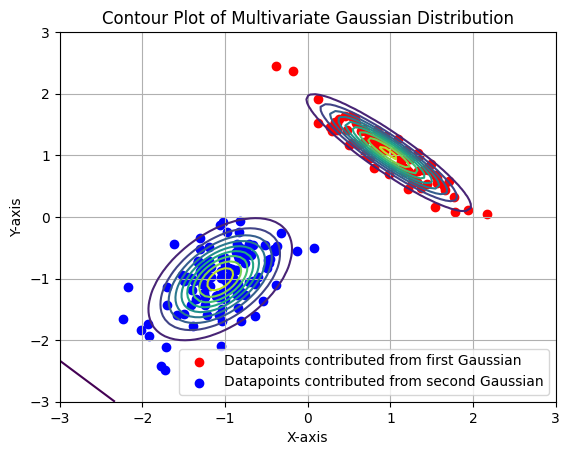

Iteration Number:7
Current Likelihood: -843.8033828486721
Algorithm converged at iteration 7


In [348]:
#All imports
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
#Part-6)-b: Implimentation of Expectation-Maximization (EM) algorithm
##########################################

def multivariate_gaussian(input, mean, cov):
    # Initialize an empty array to store the results

    mvn = multivariate_normal(mean=mean, cov=cov, allow_singular=True)
    return mvn.pdf(input).reshape(-1, 1)
   

# def multivariate_gaussian_pdf(x, mu, sigma):
#     mvn = multivariate_normal(mean=mu, cov=sigma)
#     return mvn.pdf(x)



def multivariate_gaussian_pdf(x, mu, sigma):

    n = len(mu)
    det_sigma = np.linalg.det(sigma)
    inv_sigma = np.linalg.inv(sigma)
    x = np.reshape(x, (2, 1))
    mu = np.reshape(mu, (2, 1))

    constant = 1 / ((2 * np.pi) ** (n / 2) * np.sqrt(det_sigma))
    exponent = -0.5 * np.dot(np.dot((x - mu).T, inv_sigma), (x - mu))

    return constant * np.exp(exponent)


############################################################################
#Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
  # Inputs: data, parameters of GMM model
  # Outputs: likelihood

  # Add a small value to the diagonal of covariance matrices to ensure they are positive definite
  epsilon = 1e-6
  sigma = [s + epsilon * np.eye(s.shape[0]) for s in sigma]

  type1_likelihood = multivariate_gaussian(data, mu[0], np.linalg.inv(sigma[0]))
  type2_likelihood = multivariate_gaussian(data, mu[1], np.linalg.inv(sigma[1]))

  likelihoods_matrix = np.hstack((type1_likelihood, type2_likelihood))

  pi = np.reshape(pi, (pi.shape[0], 1))

  likelihoods = np.dot(likelihoods_matrix, pi)
  likelihoods = np.clip(likelihoods, 1e-10, None)  # Add a small epsilon to avoid log(0)
  log_likelihoods = np.log(likelihoods)

  sum_log_likelihoods = np.sum(log_likelihoods)

  return sum_log_likelihoods

############################################################################
#Write a function for the expectation step else:
        
############################################################################
def expectation(data, pi, mu, sigma):
  #Inputs: data, parameters of GMM model
  #Outputs: gamma

  gamma = np.ones((len(data), len(pi)))
  for n in range(len(data)):
    #Iterate through the data points
    denominator = 0
    for k in range(len(pi)):
      #Iterate through the components in GMM
      numerator = (pi[k] * multivariate_gaussian(np.reshape(data[n, :], (1, 2)), mu[k], sigma[k]))[0, 0]
      denominator += numerator
      gamma[n,k] = numerator
    for k in range(len(pi)):
      if(denominator!=0):
        gamma[n,k] /= denominator
     

  return gamma


############################################################################
#Write a function for the maximization step.
############################################################################
def maximization(data, gamma):
    N_k = np.sum(gamma, axis=0)
    N = np.sum(N_k)

    # Update mu
    mu = np.dot(data.T, gamma)
    mu = mu / N_k
    mu = mu.T

    # Update sigma
    sigma = []
    for k in range(gamma.shape[1]):
        mu_k = np.reshape(mu[k], (2, 1))
        delta = data.T - mu_k
        gamma_diag = np.diag(gamma[:, k])
        sigma_k = np.dot(delta, np.dot(gamma_diag, delta.T)) / N_k[k]
        sigma_k += 1e-6 * np.eye(data.shape[1])  # ensure PD
        sigma.append(sigma_k)

    sigma = np.asarray(sigma)

    # Update pi
    pi = N_k / N

    return pi, mu, sigma


#Complete the below function. It plots the contours
def plot_contours(data, labels, pi, mu, sigma, gamma):
  class_1 = np.empty((0, data.shape[1]))
  class_2 = np.empty((0, data.shape[1]))

  for i in range(data.shape[0]):
      if gamma[i, 0] > gamma[i, 1]:
          class_1 = np.vstack((class_1, data[i]))
      else:
          class_2 = np.vstack((class_2, data[i]))

  plt.scatter(class_1[:, 0], class_1[:, 1], color='red', label='Datapoints contributed from first Gaussian')
  plt.scatter(class_2[:, 0], class_2[:, 1], color='blue', label='Datapoints contributed from second Gaussian')

  # Generate data points over a grid
  x = np.linspace(-3, 3, 100)
  y = np.linspace(-3, 3, 100)
  X, Y = np.meshgrid(x, y)
  grid = np.stack([X.ravel(), Y.ravel()]).T

  for i in range(pi.shape[0]):
      # Define parameters for the multivariate Gaussian distribution
      mean = mu[i]
      cov = sigma[i]

      # Compute PDF values for each grid point
      pdf_values = np.array([multivariate_gaussian_pdf(point, mean, cov) for point in grid])
      pdf_values = pdf_values.reshape(X.shape)

      # Plot contour for the current component
      contour = plt.contour(X, Y, pdf_values, levels=10)

  plt.xlabel('X-axis')
  plt.ylabel('Y-axis')
  plt.title('Contour Plot of Multivariate Gaussian Distribution')
  plt.legend()
  plt.grid(True)
  plt.show()




############################################################################
#Run the expectation and maximzation algorithm to estimate the parameters
############################################################################
data = data_full    #data to run EM-algorithm
labels = labels_full  #labels
N = 200       #number of input examples
D = 2       #data dimension
M = 2       #no.of components in GMM

pi = np.array([0.6, 0.4])      #Initialize the prior probabilities
mu1_i = np.array([0.3, 0.3])
mu2_i = np.array([-0.3, -0.3])
sig1_i = np.array([[1, 0], [0, 1]])
sig2_i = np.array([[1, 0], [0, 1]])

# Demonstrating with the true values of mean, to avoid issues with convergence

mu = np.asarray([mu1_i, mu2_i])      #Initialize the mean vectors
sigma = np.asarray([sig1_i, sig2_i])   #Initialize the covariance matrices

nsteps = 50  # Number of steps to run EM algorithm
prev_ll = None  # To store the likelihood of the previous iteration

for index in range(0, nsteps, 1):
  print("Iteration Number:" + str(index))

  # Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
  print("Current Likelihood: " + str(ll))

  # Check for convergence
  if prev_ll is not None and abs(ll - prev_ll) < 1e-3:
    print("Algorithm converged at iteration " + str(index))
    break

  prev_ll = ll  # Update the previous likelihood

  # Expectation step
  gamma = expectation(data, pi, mu, sigma)

  # Plot the contours
  plot_contours(data, labels, pi, mu, sigma, gamma)

  # Maximization step
  pi, mu, sigma = maximization(data, gamma)


## Part-6)-d: Understand the issues with EM algorithm


## Checking the affect of inialization on the convergence .


### *Affect of changing of initialization of mean keeping covariance same*

Iteration 1 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -602.7924693633265


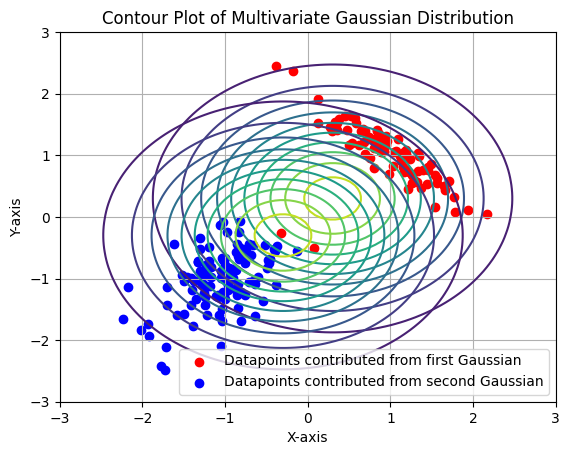

Iteration 2 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -719.7538957162355


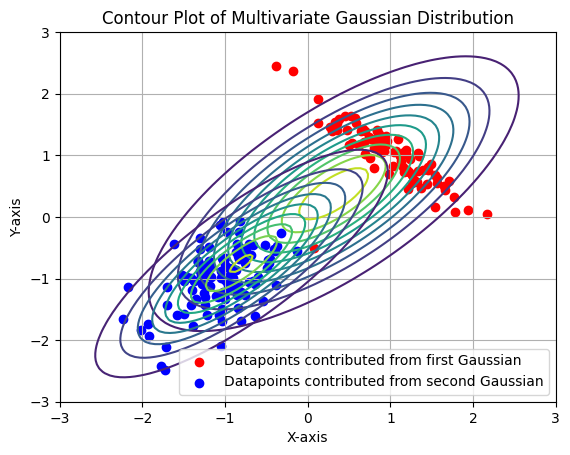

Iteration 3 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -716.5658339330814


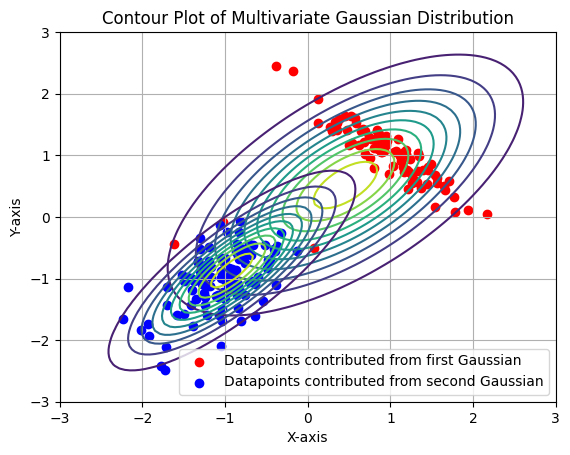

Iteration 4 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -731.8983217962987


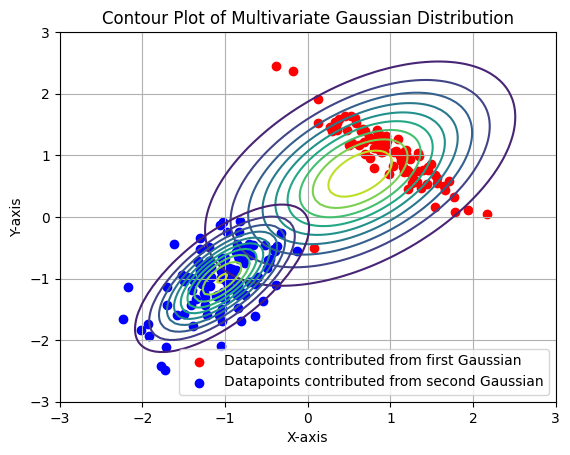

Iteration 5 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -749.3208814105221


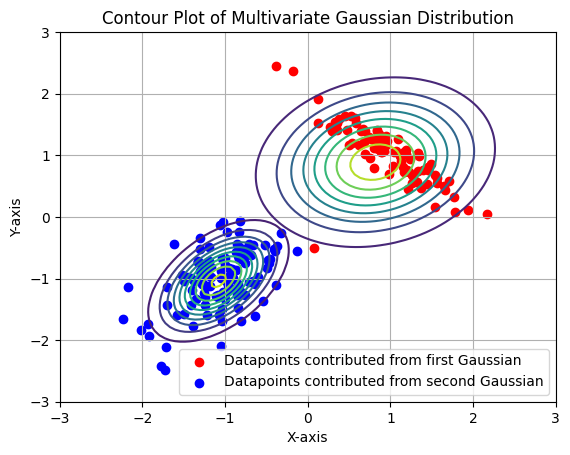

Iteration 6 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -781.8411976309014


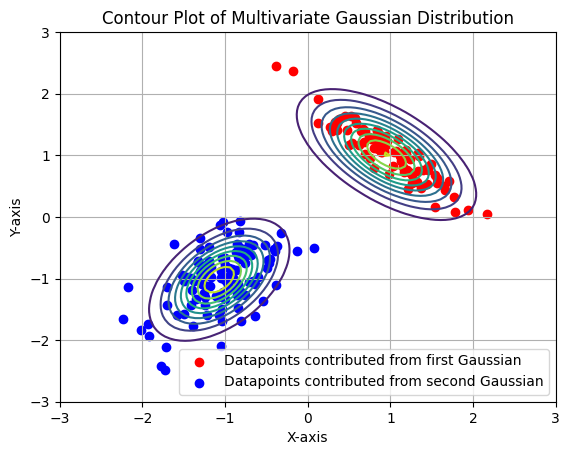

Iteration 7 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -843.8026009129856


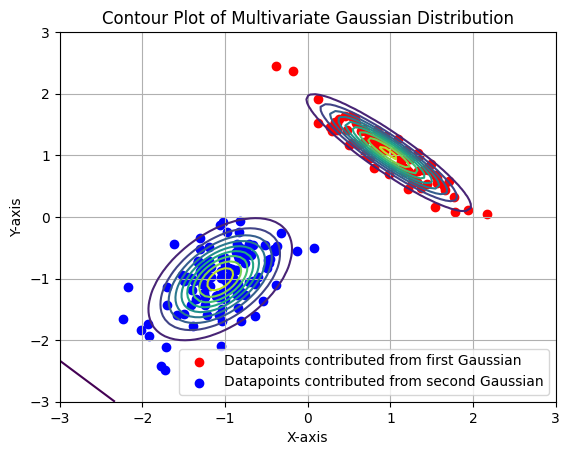

Iteration 8 with initialization [[0.3, 0.3], [-0.3, -0.3]]
Log-Likelihood: -843.8033828486721
Converged!
Iteration 1 with initialization [[-3, -5], [3, 5]]
Log-Likelihood: -2513.93952957871


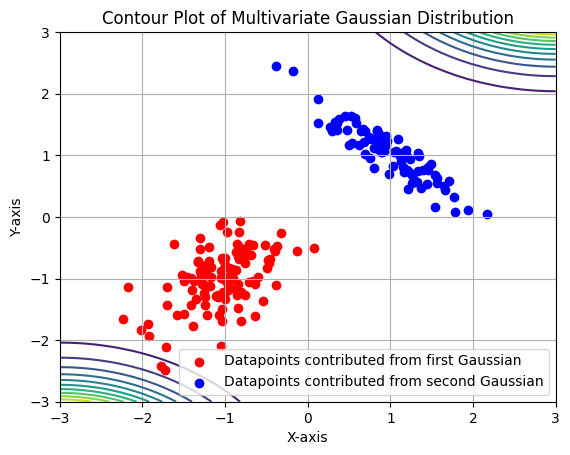

Iteration 2 with initialization [[-3, -5], [3, 5]]
Log-Likelihood: -842.0454751694833


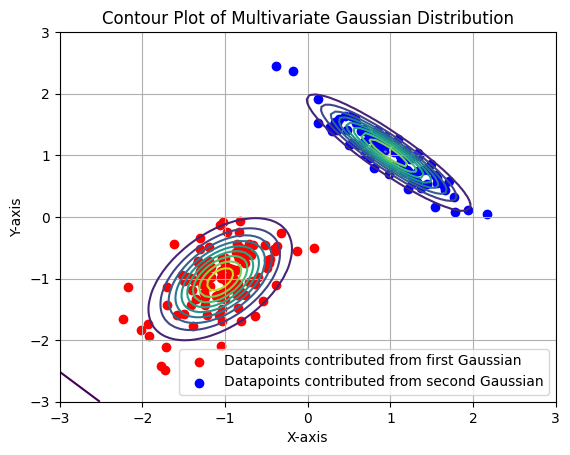

Iteration 3 with initialization [[-3, -5], [3, 5]]
Log-Likelihood: -843.8034067985545


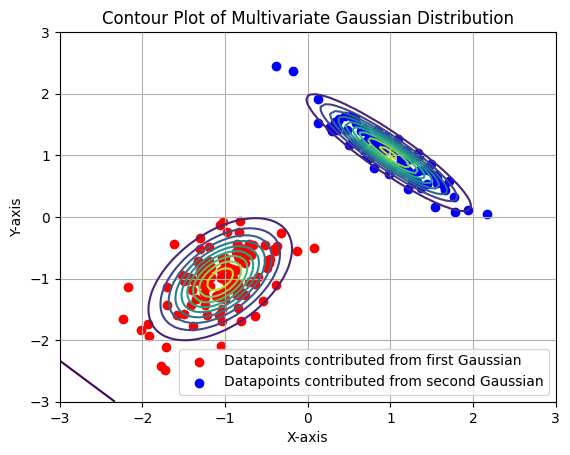

Iteration 4 with initialization [[-3, -5], [3, 5]]
Log-Likelihood: -843.8033827501433
Converged!
Iteration 1 with initialization [[10, 10], [-10, -10]]
Log-Likelihood: -4605.17018598809


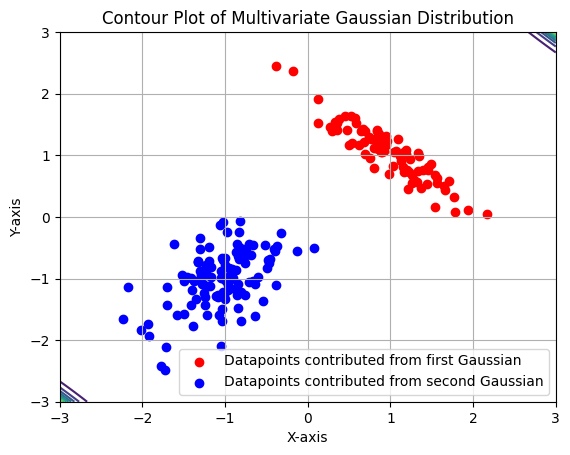

Iteration 2 with initialization [[10, 10], [-10, -10]]
Log-Likelihood: -843.7802179624478


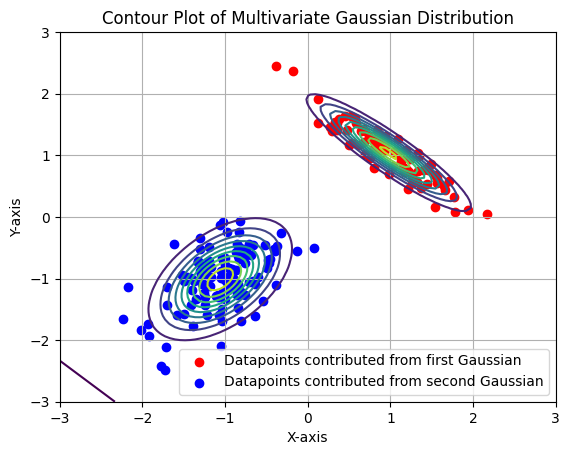

Iteration 3 with initialization [[10, 10], [-10, -10]]
Log-Likelihood: -843.8033832556788


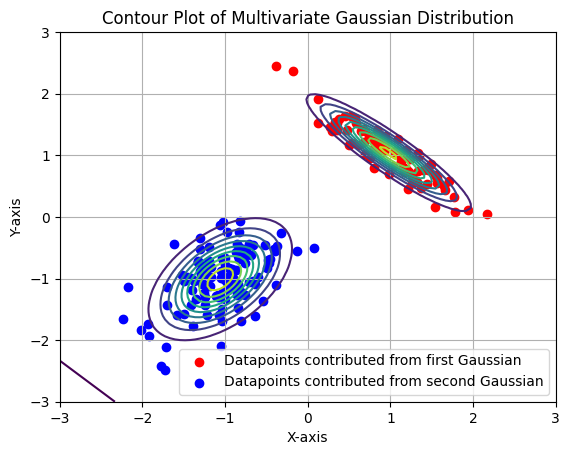

Iteration 4 with initialization [[10, 10], [-10, -10]]
Log-Likelihood: -843.8033827396662
Converged!
Iteration 1 with initialization [[25, 25], [-25, -25]]
Log-Likelihood: -4605.17018598809


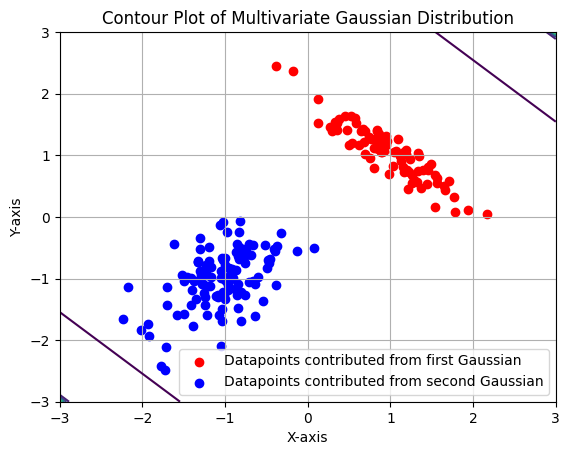

Iteration 2 with initialization [[25, 25], [-25, -25]]
Log-Likelihood: -843.803754442888


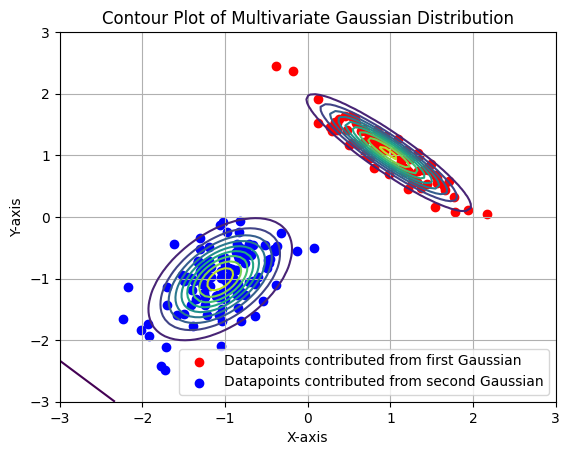

Iteration 3 with initialization [[25, 25], [-25, -25]]
Log-Likelihood: -843.803382880311
Converged!
Iteration 1 with initialization [[40, 40], [-40, -40]]
Log-Likelihood: -4605.17018598809


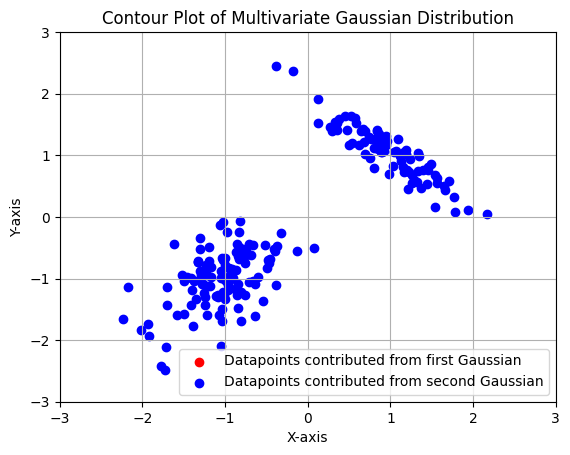

Iteration 2 with initialization [[40, 40], [-40, -40]]


/tmp/ipykernel_5250/2004366646.py:101: RuntimeWarning: invalid value encountered in divide
  mu = mu / N_k
/tmp/ipykernel_5250/2004366646.py:117: RuntimeWarning: invalid value encountered in divide
  pi = N_k / N


ValueError: array must not contain infs or NaNs

In [349]:


# Function to run EM algorithm with different initializations of mean
def run_em_with_initialization(data, labels, initial_means, sigma, pi, nsteps=20):
    mu = np.asarray(initial_means)  # Initialize the mean vectors
    sigma = np.asarray(sigma)       # Initialize the covariance matrices
    pi = np.asarray(pi)             # Initialize the prior probabilities

    prev_ll = None  # To store the likelihood of the previous iteration

    for index in range(nsteps):
        print(f"Iteration {index + 1} with initialization {initial_means}")

        # Compute the likelihood
        ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
        print(f"Log-Likelihood: {ll}")

        # Check for convergence
        if prev_ll is not None and abs(ll - prev_ll) < 1e-3:
            print("Converged!")
            break

        prev_ll = ll  # Update the previous likelihood

        # Expectation step
        gamma = expectation(data, pi, mu, sigma)

        # Plot the contours
        plot_contours(data, labels, pi, mu, sigma, gamma)

        # Maximization step
        pi, mu, sigma = maximization(data, gamma)

# Data and parameters
data = data_full
labels = labels_full
pi = [0.6, 0.4]

sig1_i = np.array([[1, 0], [0, 1]])
sig2_i = np.array([[1, 0], [0, 1]])
sigma = [sig1_i, sig2_i]

# Initializations of mean
initializations = [
    [[0.3, 0.3], [-0.3, -0.3]],  # Near to actual
    # [[0.5, 0.5], [-0.5, -0.5]],  # Slightly farther
    # [[1.0, 1.0], [-1.0, -1.0]],  # Very close to actual
    # [[2.0, 2.0], [-2.0, -2.0]] ,  # Farther from actual
    # # Add more initializations as needed
    [[-3,-5], [3,5]],  # Far from actual
    # [[0.0, 0.0], [0.0, 0.0]],  # Same mean for both
    [[10,10]    ,[-10,-10]],
    [[25, 25], [-25, -25]],  # Different means
    [[40,40],[-40,-40]]

]

# Run EM for each initialization
for init_means in initializations:
    run_em_with_initialization(data, labels, init_means, sigma, pi, nsteps=20)


    # To avoid the issue of log of zero, we can add a small epsilon to the likelihoods before taking the log.
    # Update the likelihood function to handle this case:



## Keeping the mean same but changing the covariance 


Running EM with covariance initialization: [[[1, 0], [0, 1]], [[1, 0], [0, 1]]]
Iteration 1
Log-Likelihood: -602.7924671443992


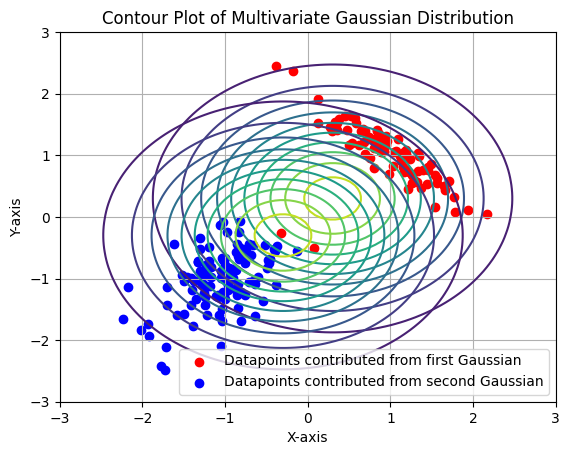

Iteration 2
Log-Likelihood: -478.76119662789927


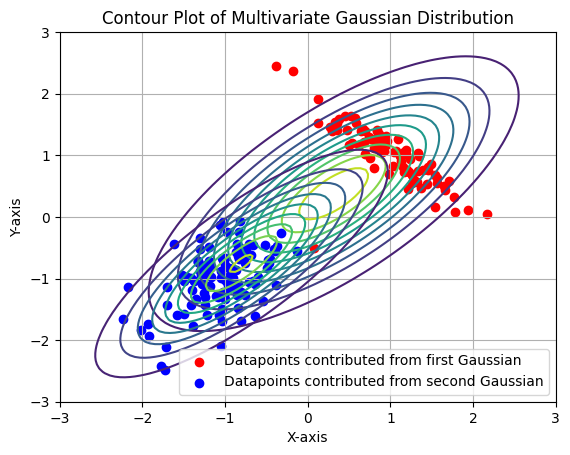

Iteration 3
Log-Likelihood: -459.12120970190017


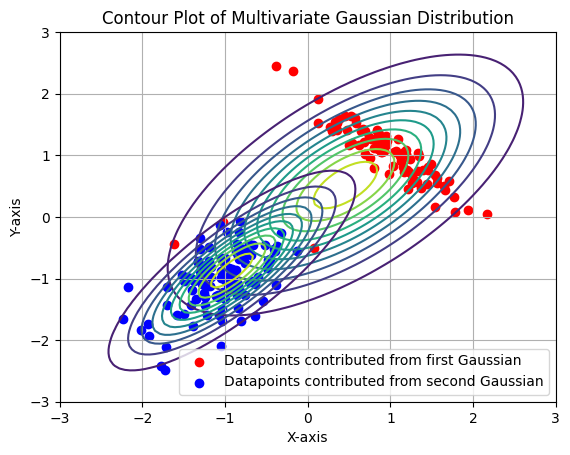

Iteration 4
Log-Likelihood: -426.30711471549637


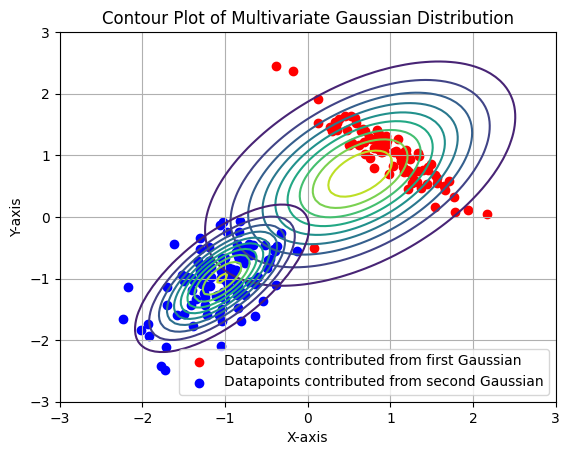

Iteration 5
Log-Likelihood: -390.7232404476297


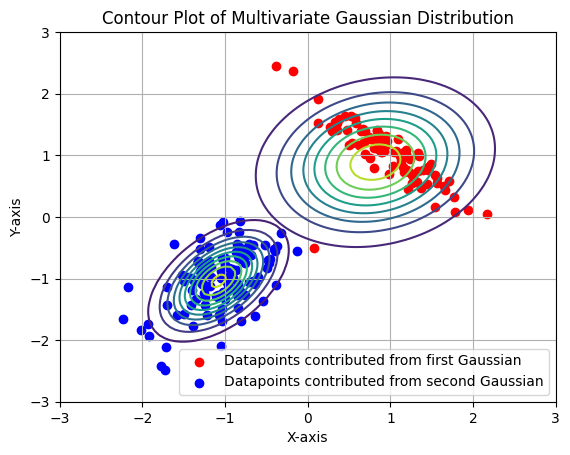

Iteration 6
Log-Likelihood: -324.7474551162401


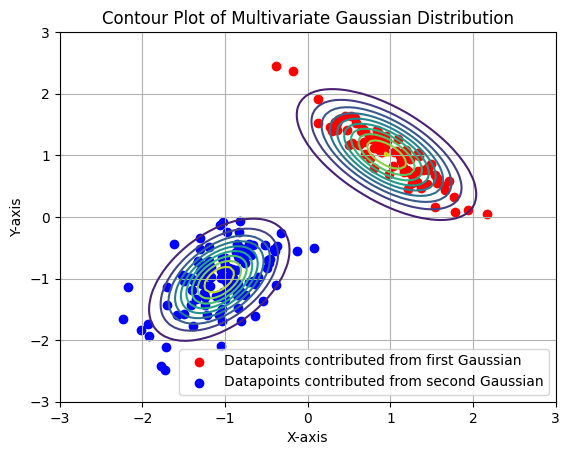

Iteration 7
Log-Likelihood: -287.470347979766


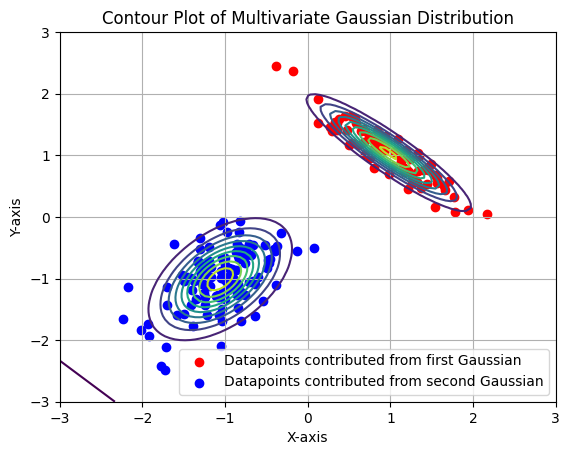

Iteration 8
Log-Likelihood: -287.4703479440778
Converged!
Running EM with covariance initialization: [[[0.5, 0], [0, 0.5]], [[0.5, 0], [0, 0.5]]]
Iteration 1
Log-Likelihood: -444.01154103606893


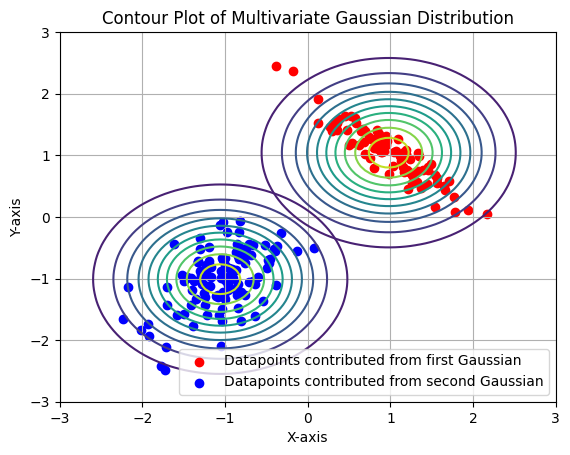

Iteration 2
Log-Likelihood: -297.5429220676964


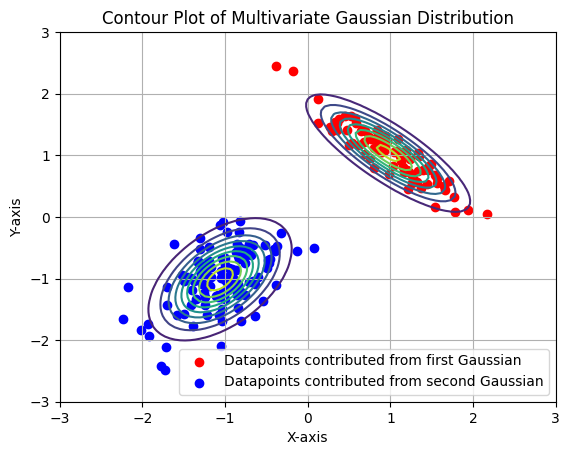

Iteration 3
Log-Likelihood: -287.47034794906165


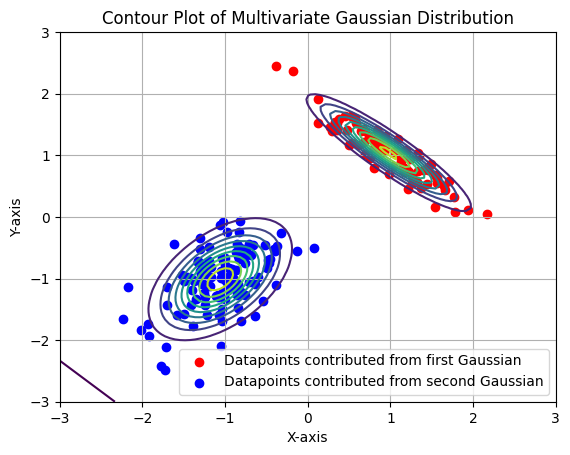

Iteration 4
Log-Likelihood: -287.4703479440778
Converged!
Running EM with covariance initialization: [[[2, 0], [0, 2]], [[2, 0], [0, 2]]]
Iteration 1
Log-Likelihood: -636.0780714954194


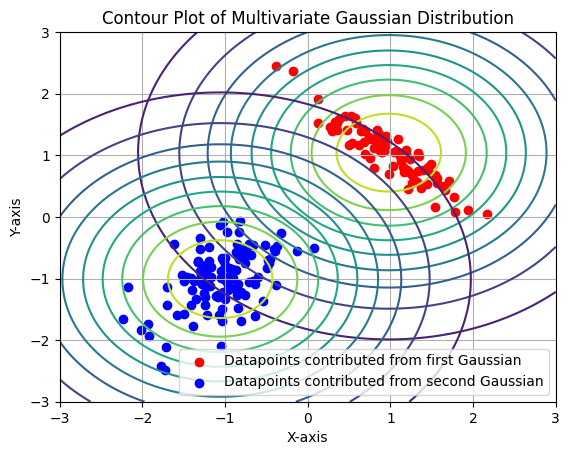

Iteration 2
Log-Likelihood: -446.28869973108056


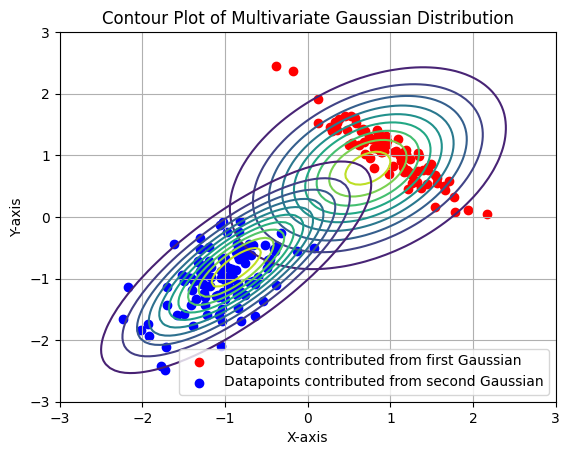

Iteration 3
Log-Likelihood: -370.2088224107337


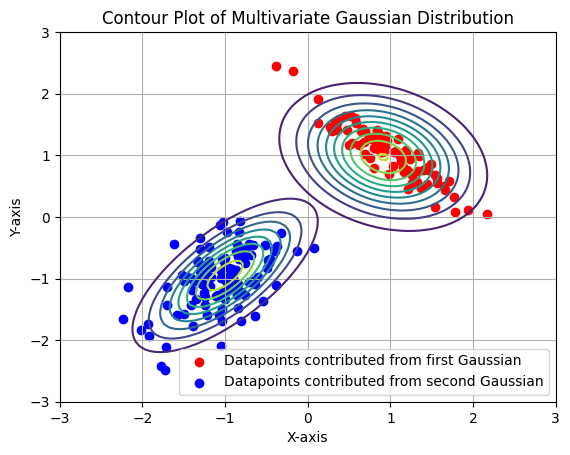

Iteration 4
Log-Likelihood: -287.54065802871287


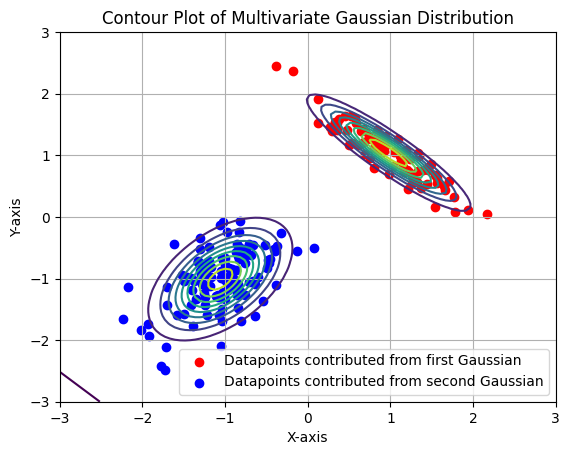

Iteration 5
Log-Likelihood: -287.4703479448028


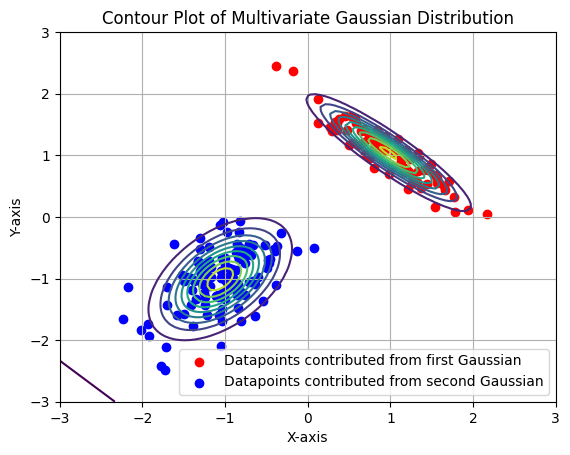

Iteration 6
Log-Likelihood: -287.47034794407773
Converged!
Running EM with covariance initialization: [[[1, 0.5], [0.5, 1]], [[1, -0.5], [-0.5, 1]]]
Iteration 1
Log-Likelihood: -536.7503569644483


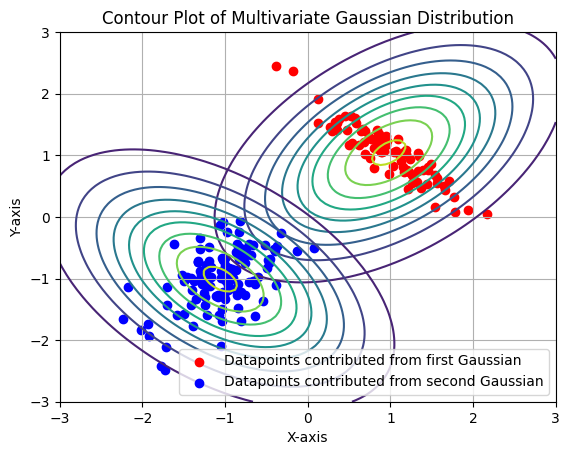

Iteration 2
Log-Likelihood: -390.0008473823828


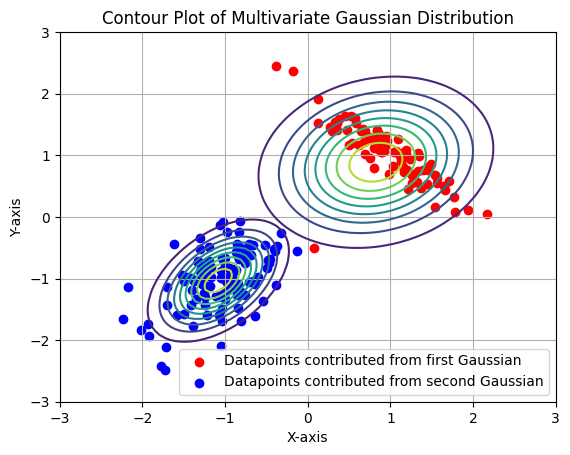

Iteration 3
Log-Likelihood: -322.9053081550566


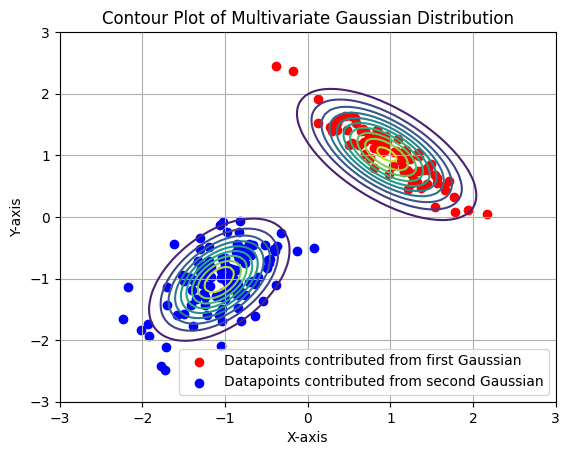

Iteration 4
Log-Likelihood: -287.47034796157243


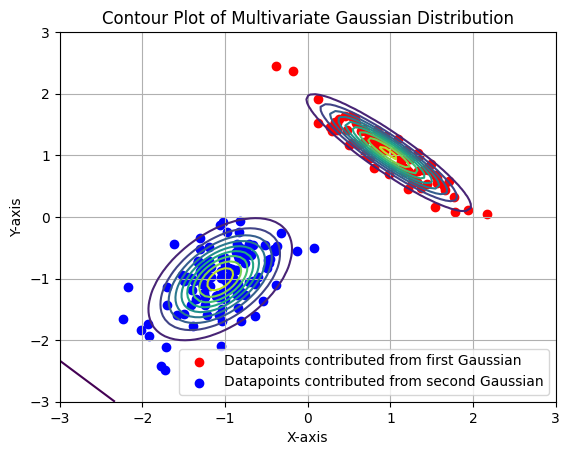

Iteration 5
Log-Likelihood: -287.47034794407784
Converged!
Running EM with covariance initialization: [[[0.1, 0], [0, 0.1]], [[0.1, 0], [0, 0.1]]]
Iteration 1
Log-Likelihood: -441.9357414989814


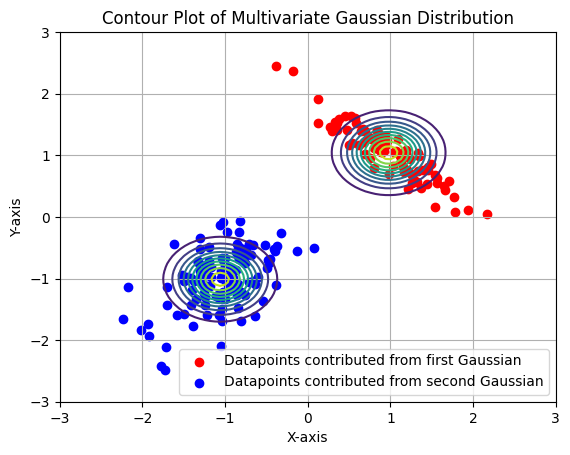

Iteration 2
Log-Likelihood: -287.4703517346304


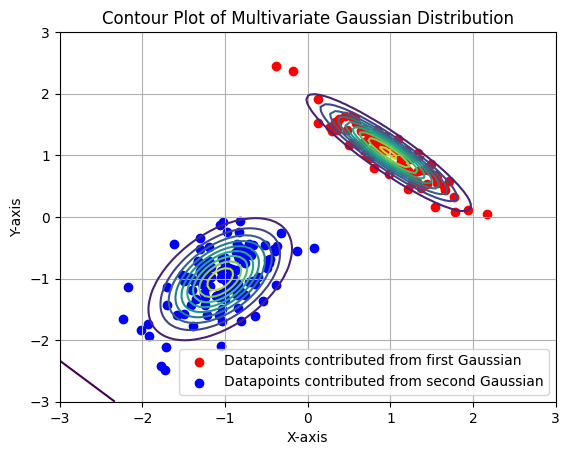

Iteration 3
Log-Likelihood: -287.47034794407784
Converged!


In [ ]:
# Function to run EM algorithm with same mean and different covariance initializations
def run_em_with_covariance(data, labels, mean, initial_covariances, pi, nsteps=20):
    mu = np.asarray(mean)  # Initialize the mean vectors (same for both components)
    pi = np.asarray(pi)    # Initialize the prior probabilities

    for cov in initial_covariances:
        sigma = np.asarray(cov)  # Initialize the covariance matrices
        prev_ll = None  # To store the likelihood of the previous iteration

        print(f"Running EM with covariance initialization: {cov}")

        for index in range(nsteps):
            print(f"Iteration {index + 1}")

            # Compute the likelihood
            ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
            print(f"Log-Likelihood: {ll}")

            # Check for convergence
            if prev_ll is not None and abs(ll - prev_ll) < 1e-3:
                print("Converged!")
                break

            prev_ll = ll  # Update the previous likelihood

            # Expectation step
            gamma = expectation(data, pi, mu, sigma)

            # Plot the contours
            plot_contours(data, labels, pi, mu, sigma, gamma)

            # Maximization step
            pi, mu, sigma = maximization(data, gamma)

# Data and parameters
data = data_full
labels = labels_full
pi = [0.6, 0.4]

# Same mean for both components
mean = [[0.3, 0.3], [-0.3, -0.3]]

# Different covariance initializations
initial_covariances = [
    [[[1, 0], [0, 1]], [[1, 0], [0, 1]]],  # Identity covariance
    [[[0.5, 0], [0, 0.5]], [[0.5, 0], [0, 0.5]]],  # Smaller covariance
    [[[2, 0], [0, 2]], [[2, 0], [0, 2]]],  # Larger covariance
    [[[1, 0.5], [0.5, 1]], [[1, -0.5], [-0.5, 1]]],  # Correlated covariance
    [[[0.1, 0], [0, 0.1]], [[0.1, 0], [0, 0.1]]],  # Very small covariance
]

# Run EM for each covariance initialization
run_em_with_covariance(data, labels, mean, initial_covariances, pi, nsteps=20)


Iteration Number:0
Current Likelihood: -778.2037541083005


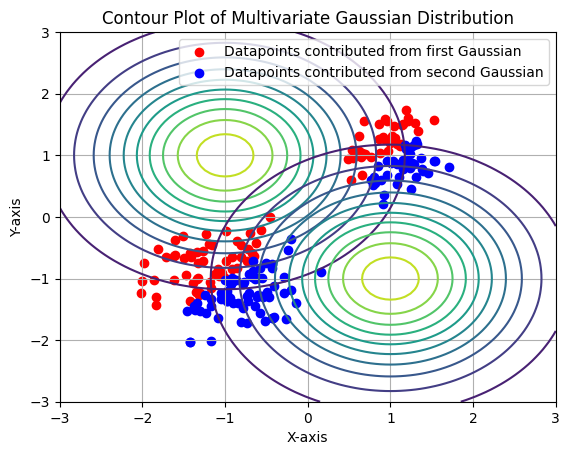

Iteration Number:1
Current Likelihood: -446.27082316881143


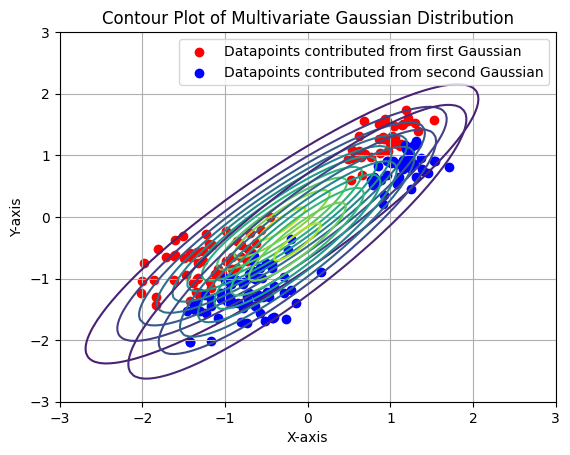

Iteration Number:2
Current Likelihood: -444.46425677974923


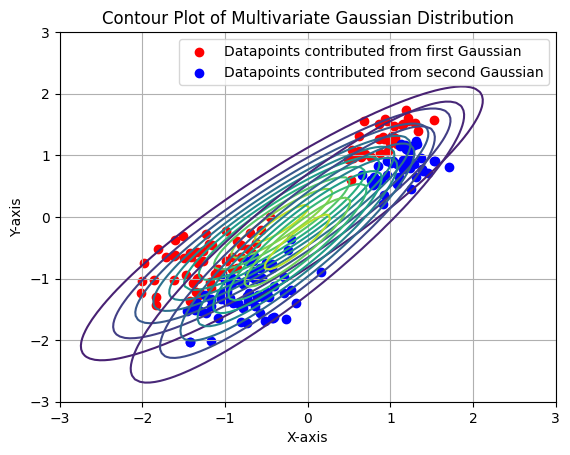

Iteration Number:3
Current Likelihood: -443.5486132445108


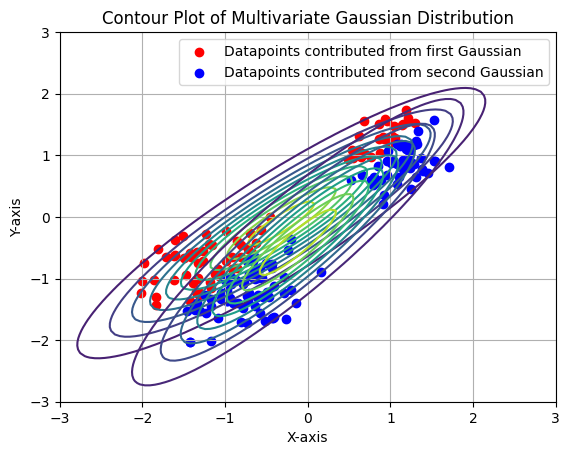

Iteration Number:4
Current Likelihood: -443.1197646213308


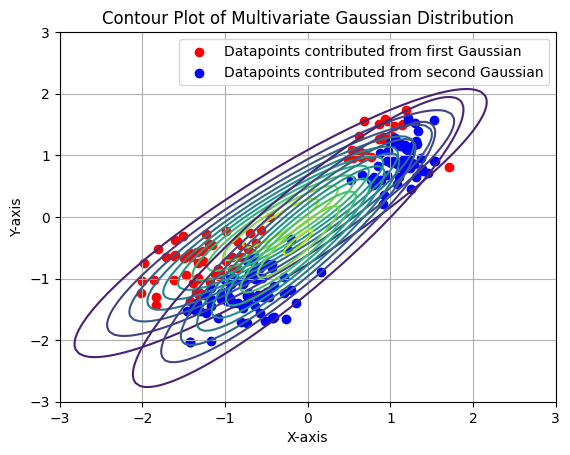

Iteration Number:5
Current Likelihood: -442.9173462832872


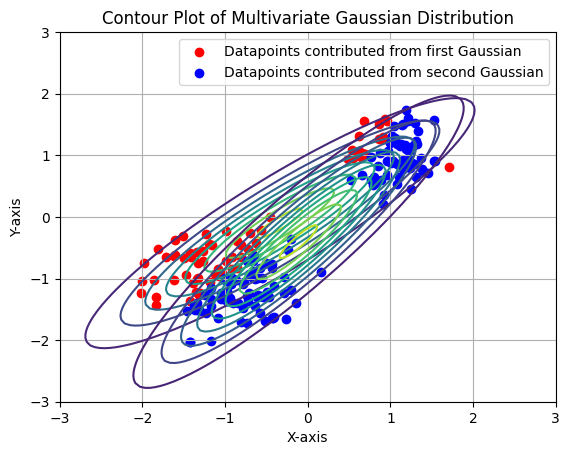

Iteration Number:6
Current Likelihood: -442.80369589072217


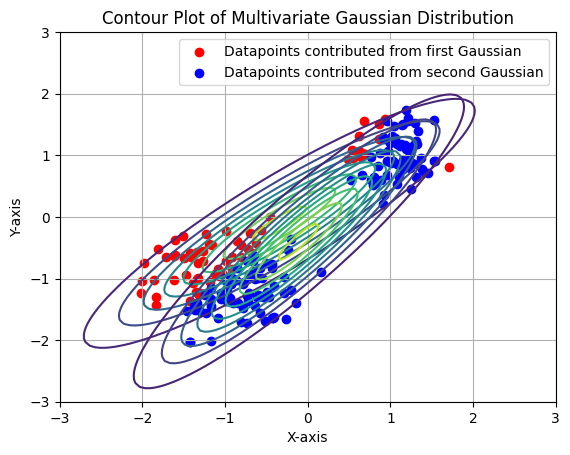

Iteration Number:7
Current Likelihood: -442.72088739229775


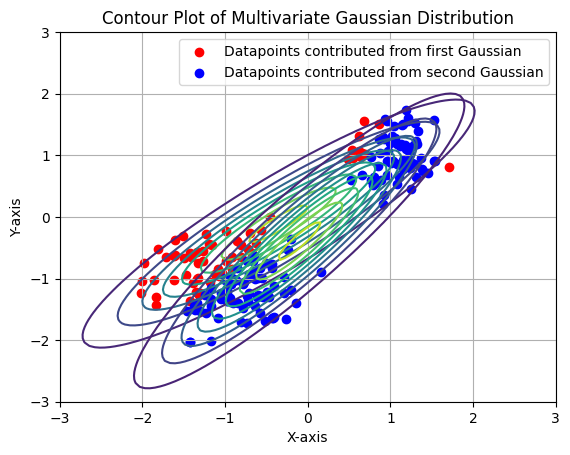

Iteration Number:8
Current Likelihood: -442.64789413977337


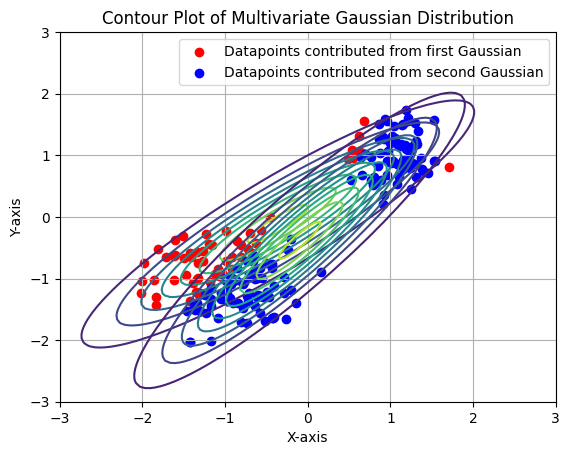

Iteration Number:9
Current Likelihood: -442.5774944904408


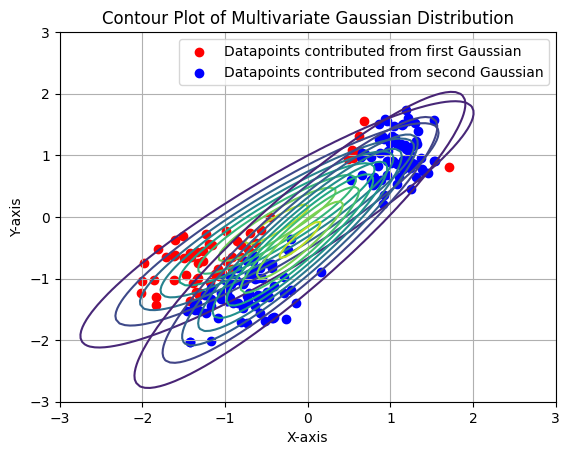

Iteration Number:10
Current Likelihood: -442.5070221790238


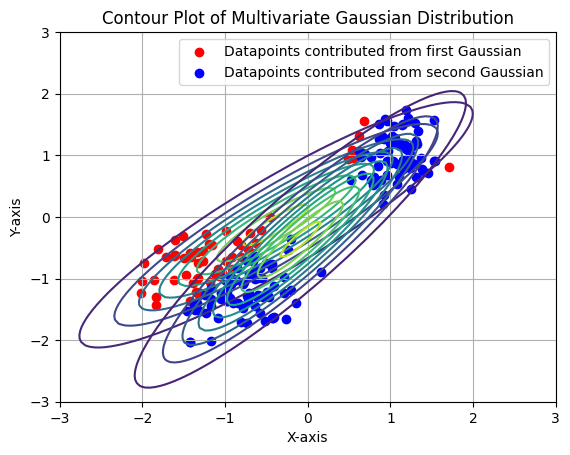

Iteration Number:11
Current Likelihood: -442.4351829476411


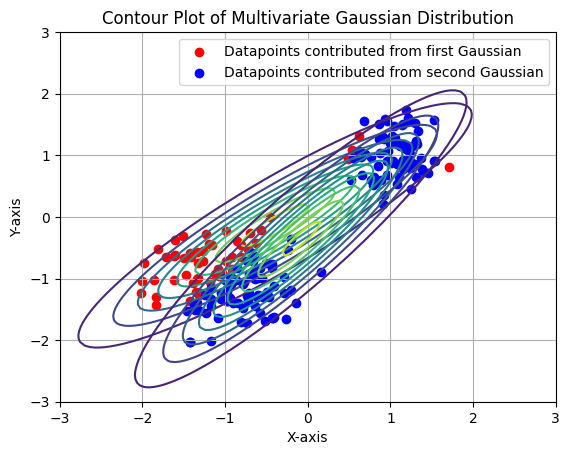

Iteration Number:12
Current Likelihood: -442.36101489851467


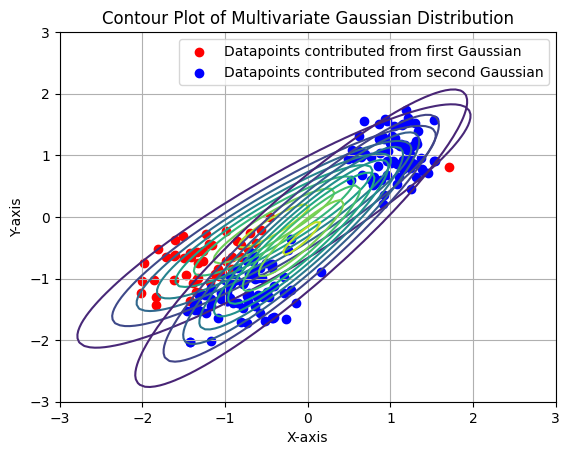

Iteration Number:13
Current Likelihood: -442.28351762544787


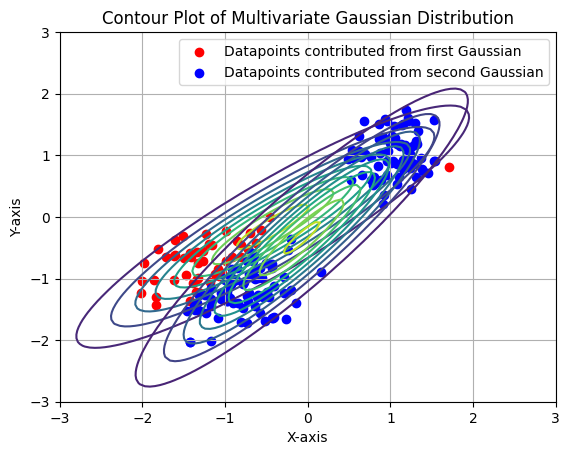

Iteration Number:14
Current Likelihood: -442.20145820861944


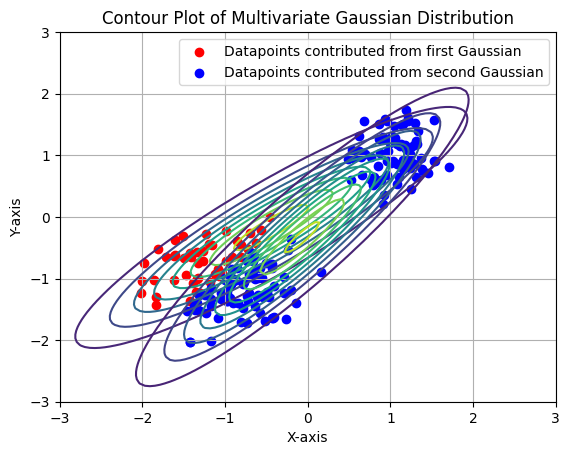

Iteration Number:15
Current Likelihood: -442.1131853975711


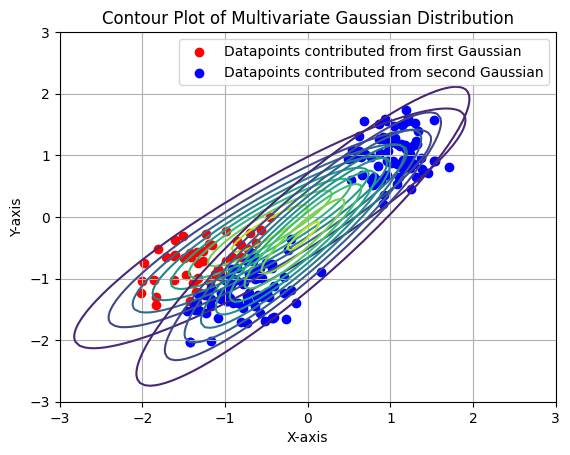

Iteration Number:16
Current Likelihood: -442.01636767693367


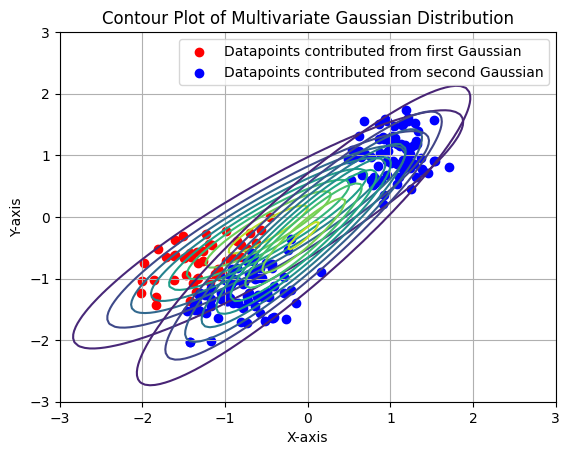

Iteration Number:17
Current Likelihood: -441.90756373396033


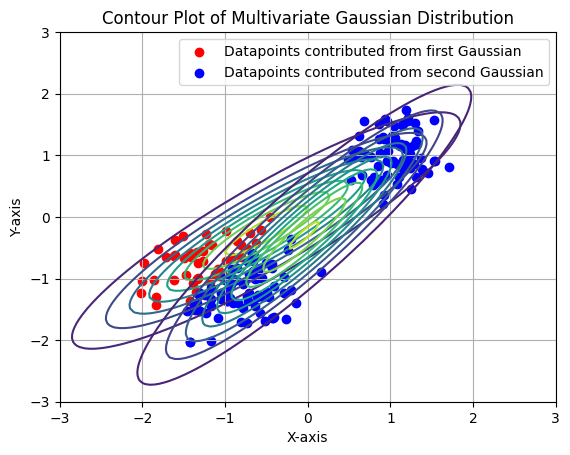

Iteration Number:18
Current Likelihood: -441.78146153417913


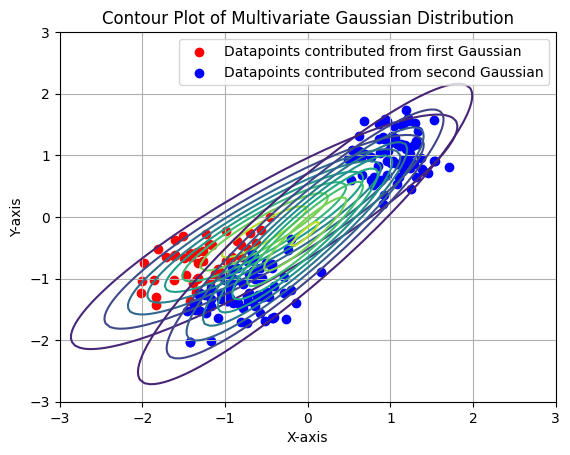

Iteration Number:19
Current Likelihood: -441.6294377763775


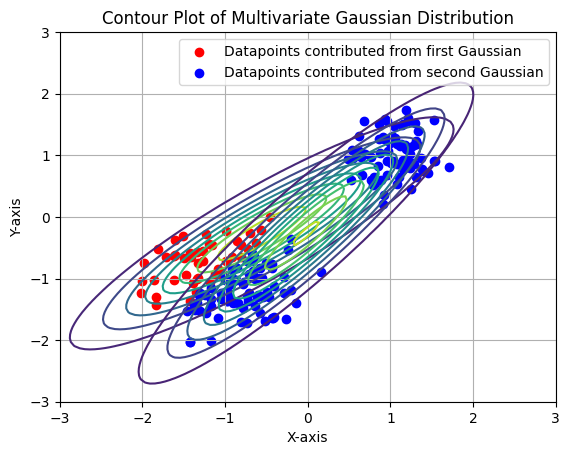

Iteration Number:20
Current Likelihood: -441.43662403723334


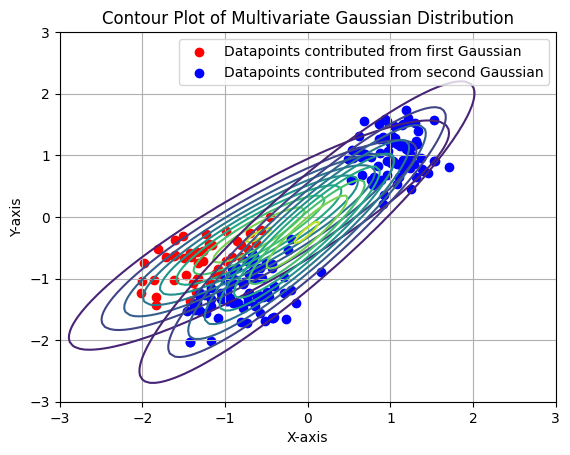

Iteration Number:21
Current Likelihood: -441.1753878804012


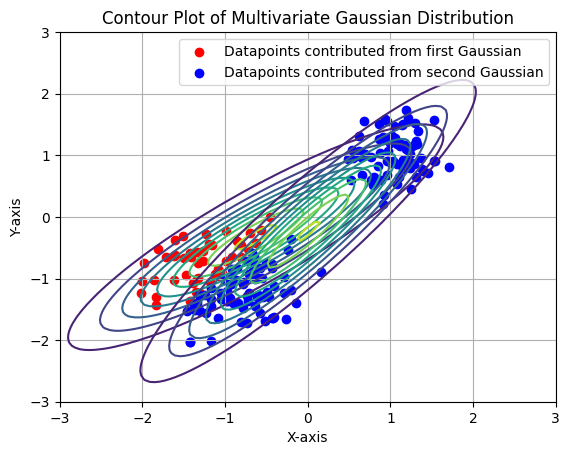

Iteration Number:22
Current Likelihood: -440.7892030223105


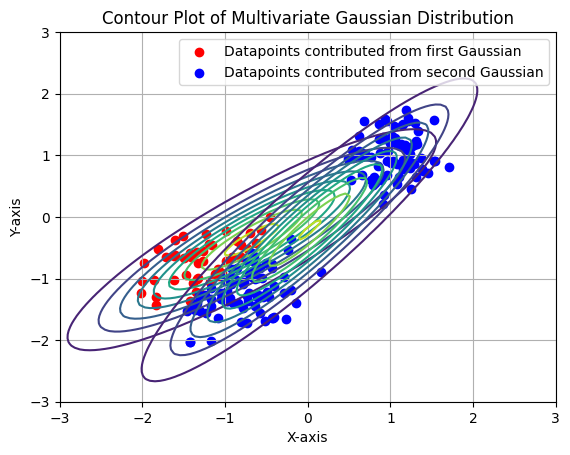

Iteration Number:23
Current Likelihood: -440.14693756525133


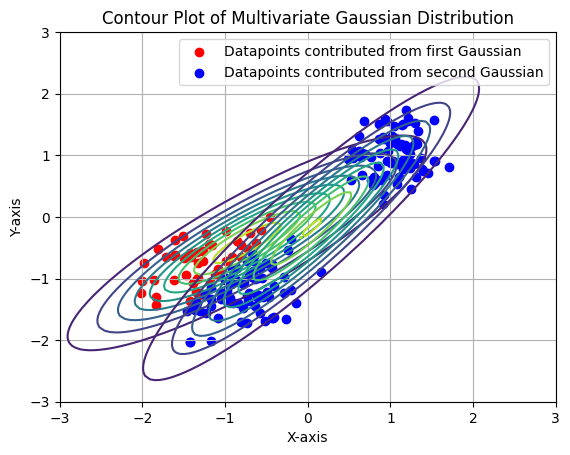

Iteration Number:24
Current Likelihood: -438.8891129184175


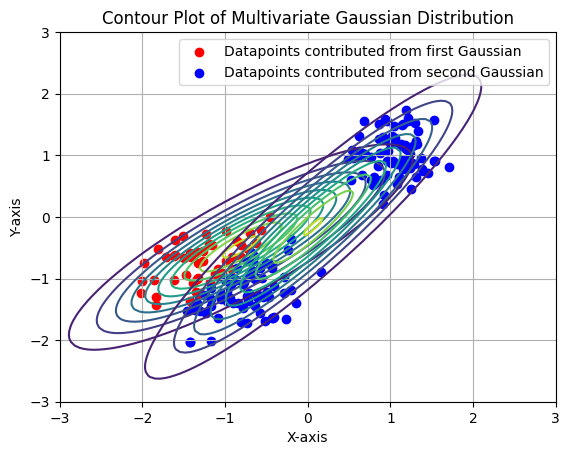

Iteration Number:25
Current Likelihood: -435.79907161721394


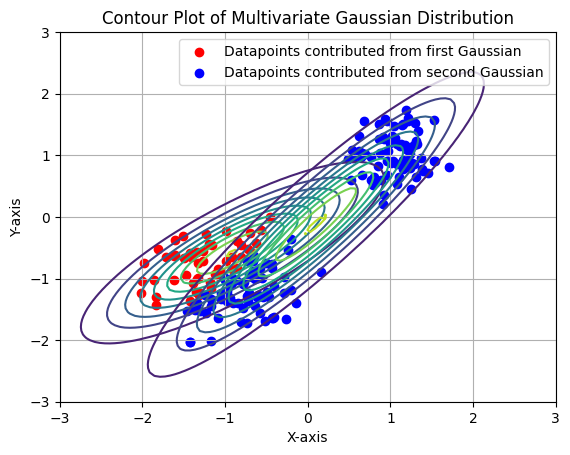

Iteration Number:26
Current Likelihood: -426.11647469578236


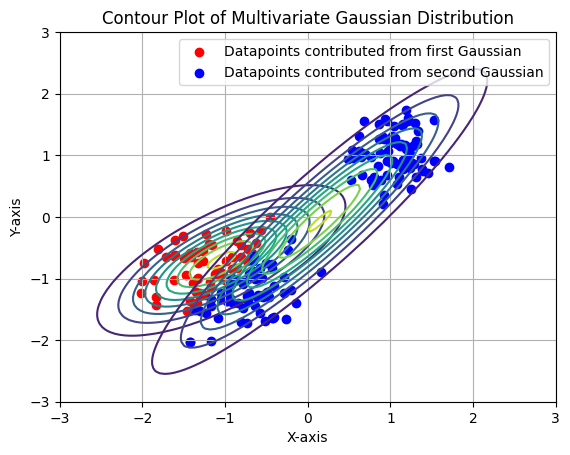

Iteration Number:27
Current Likelihood: -402.7669611378971


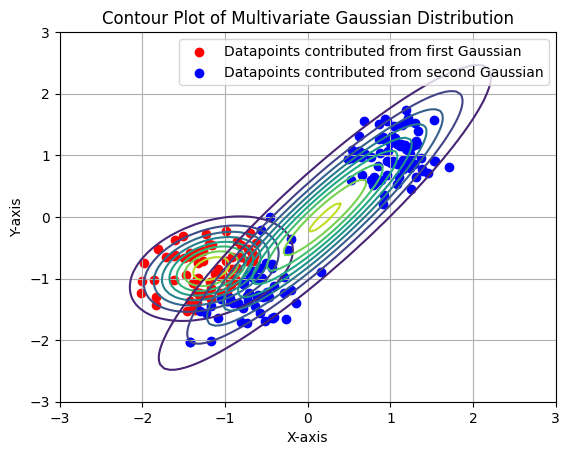

Iteration Number:28
Current Likelihood: -390.3036592138534


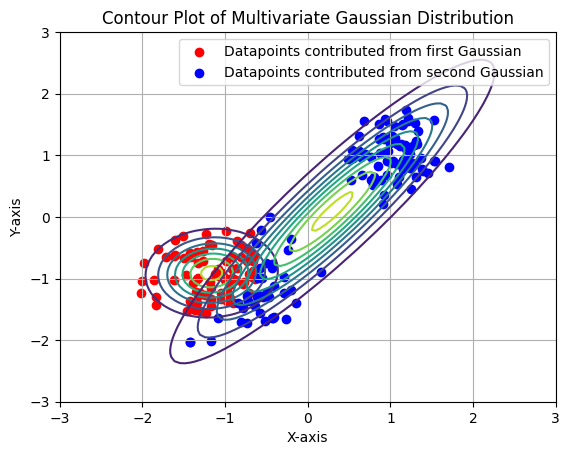

Iteration Number:29
Current Likelihood: -381.95532745867456


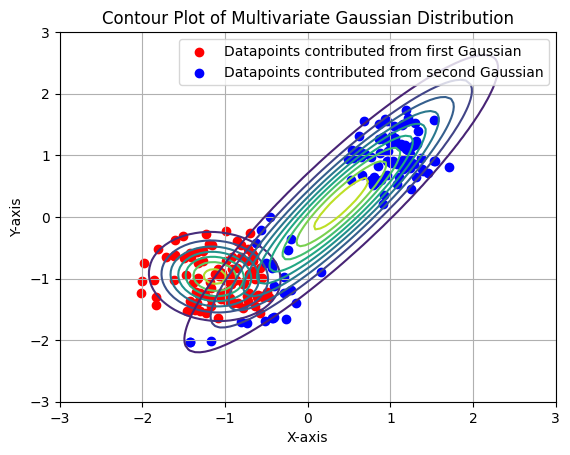

Iteration Number:30
Current Likelihood: -374.62489032550184


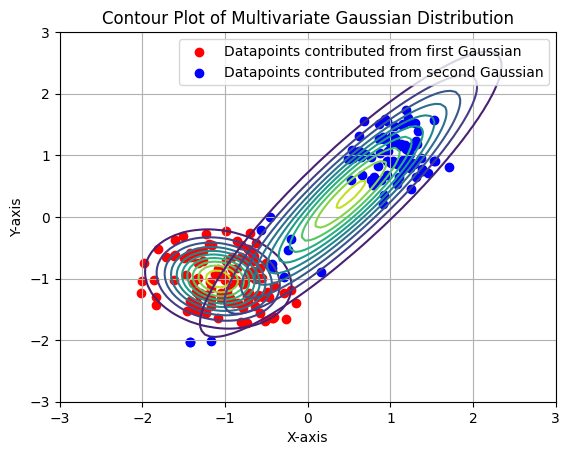

Iteration Number:31
Current Likelihood: -368.0441323165864


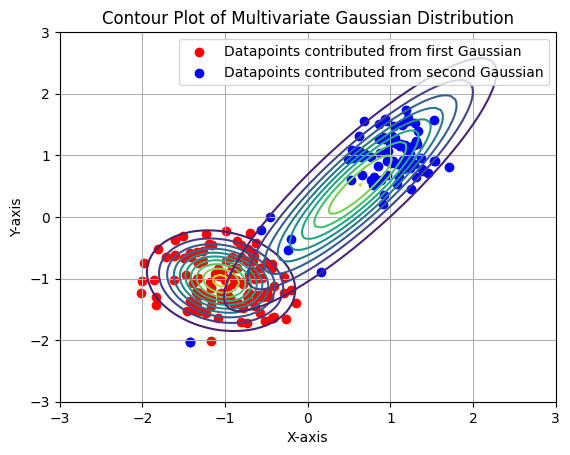

Iteration Number:32
Current Likelihood: -360.00760248932795


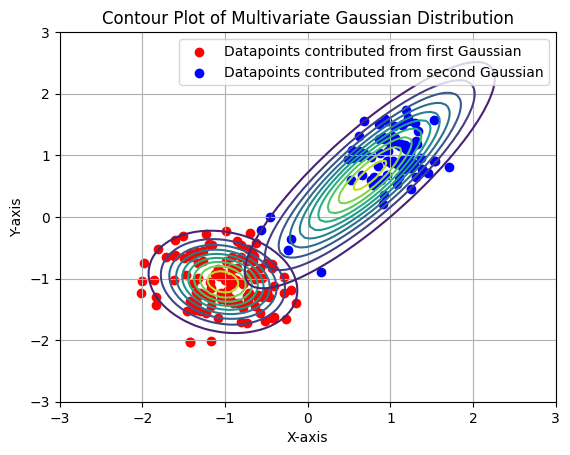

Iteration Number:33
Current Likelihood: -345.3644590040708


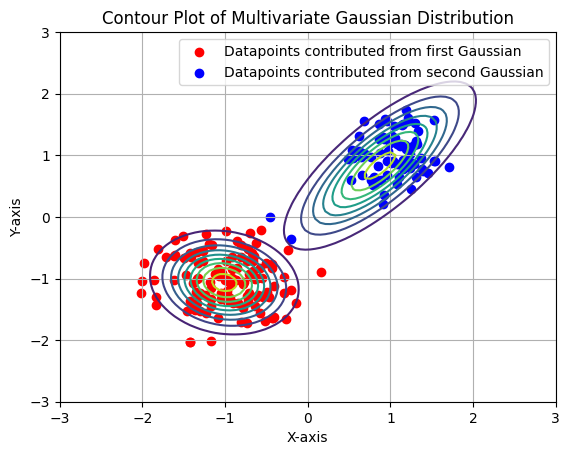

Iteration Number:34
Current Likelihood: -321.1386953283827


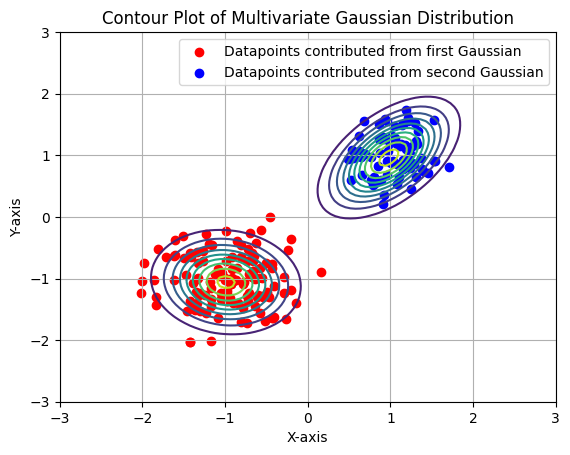

Iteration Number:35
Current Likelihood: -304.36750884751325


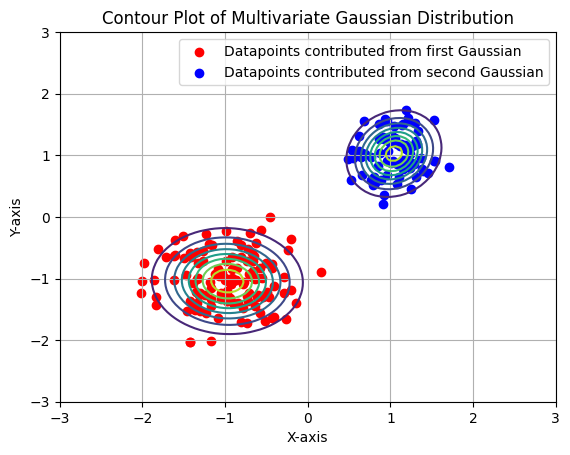

Iteration Number:36
Current Likelihood: -304.20043712629626


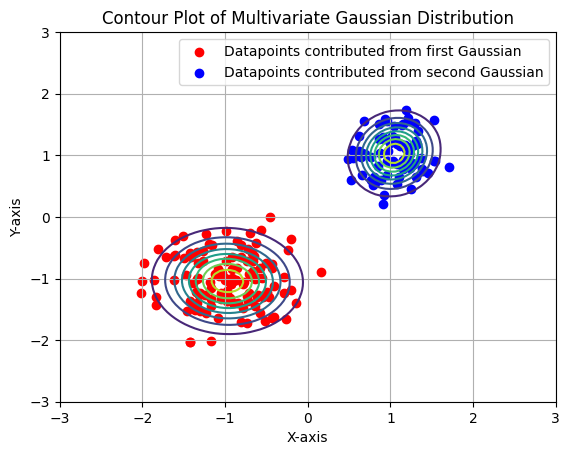

Iteration Number:37
Current Likelihood: -304.2004371261563


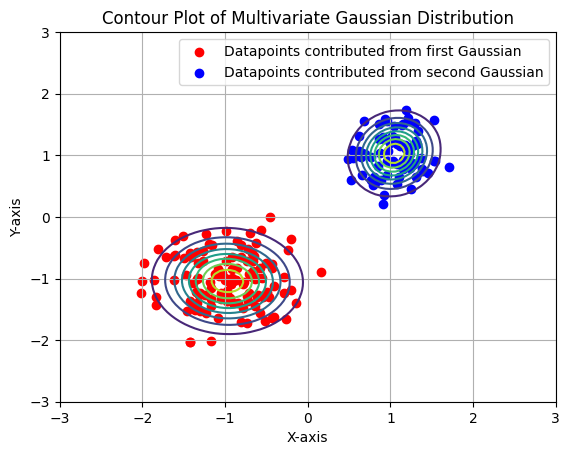

Iteration Number:38
Current Likelihood: -304.2004371261563


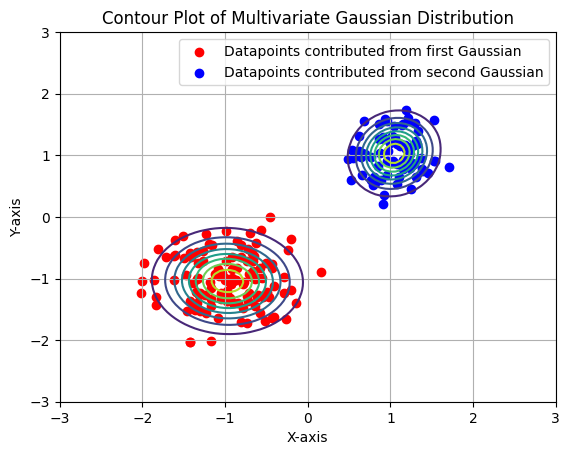

Iteration Number:39
Current Likelihood: -304.2004371261563


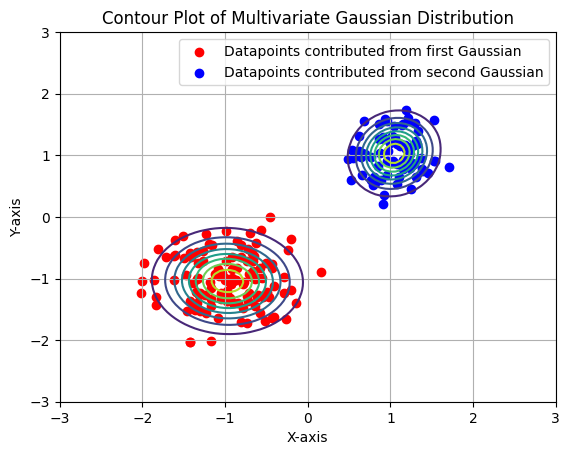

Iteration Number:40
Current Likelihood: -304.2004371261563


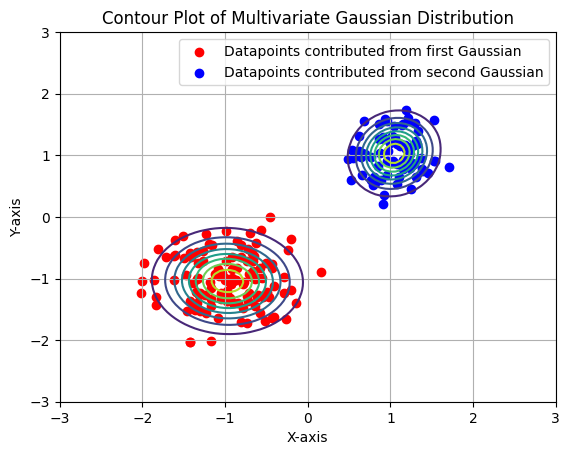

Iteration Number:41
Current Likelihood: -304.2004371261563


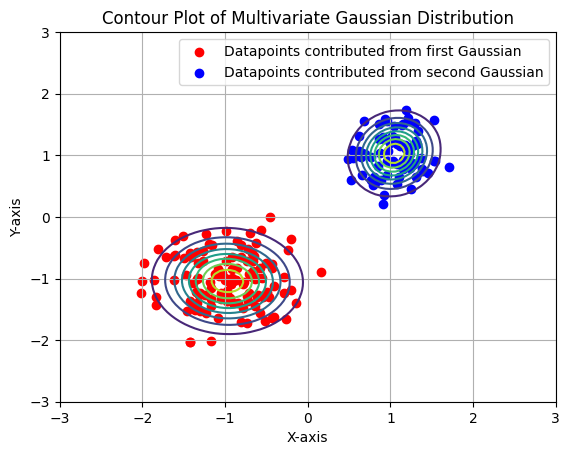

Iteration Number:42
Current Likelihood: -304.2004371261563


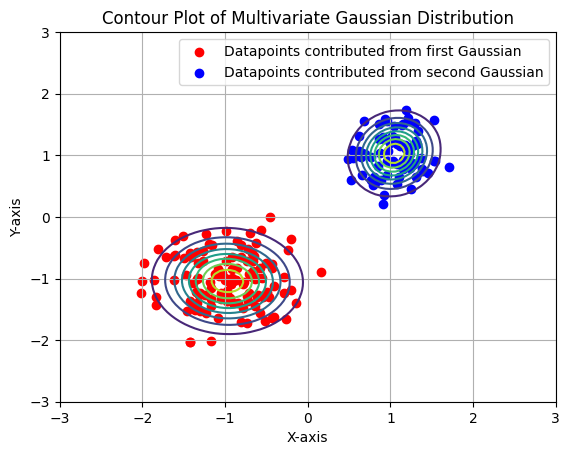

Iteration Number:43
Current Likelihood: -304.2004371261563


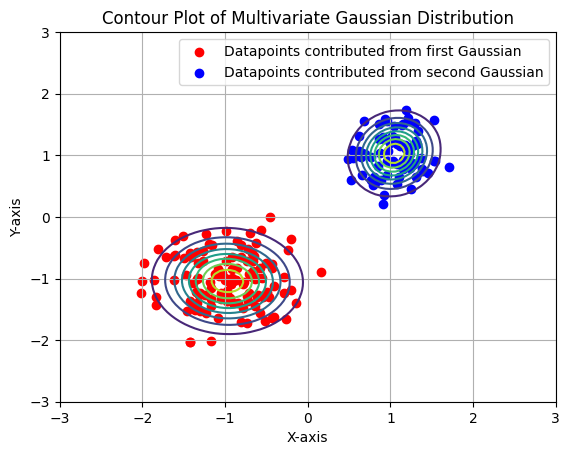

Iteration Number:44
Current Likelihood: -304.2004371261563


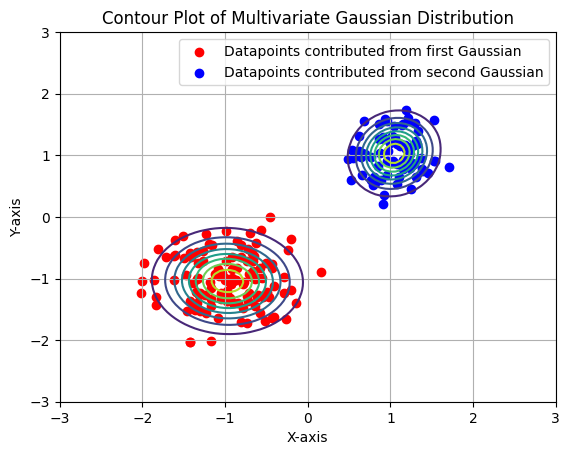

Iteration Number:45
Current Likelihood: -304.2004371261563


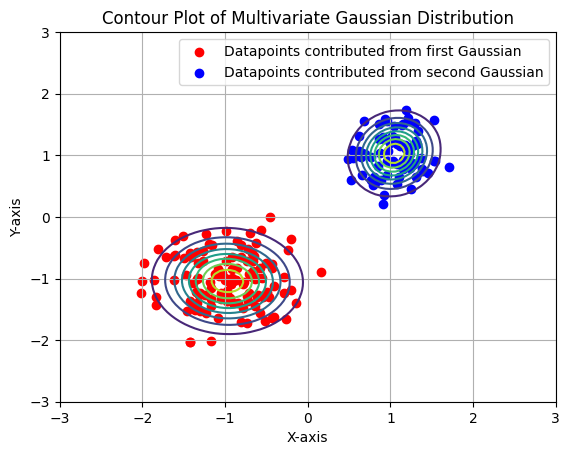

Iteration Number:46
Current Likelihood: -304.2004371261563


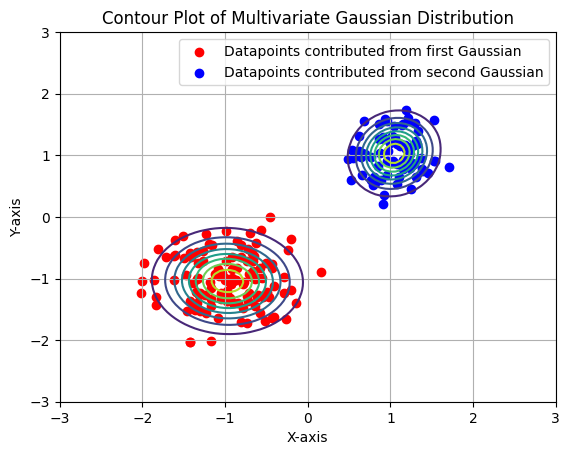

Iteration Number:47
Current Likelihood: -304.2004371261563


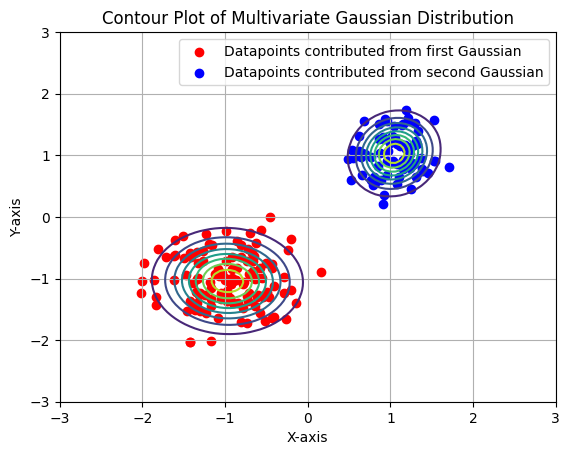

Iteration Number:48
Current Likelihood: -304.2004371261563


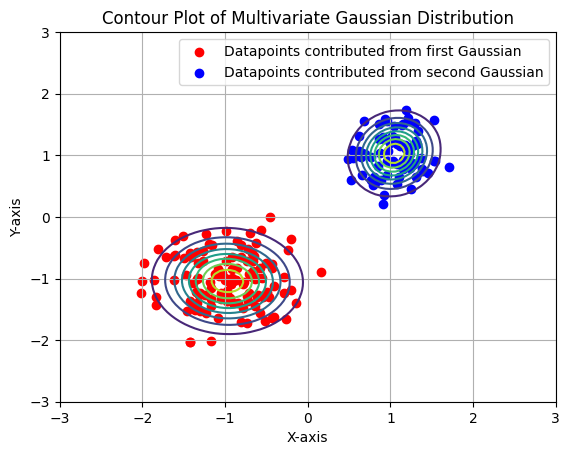

Iteration Number:49
Current Likelihood: -304.2004371261563


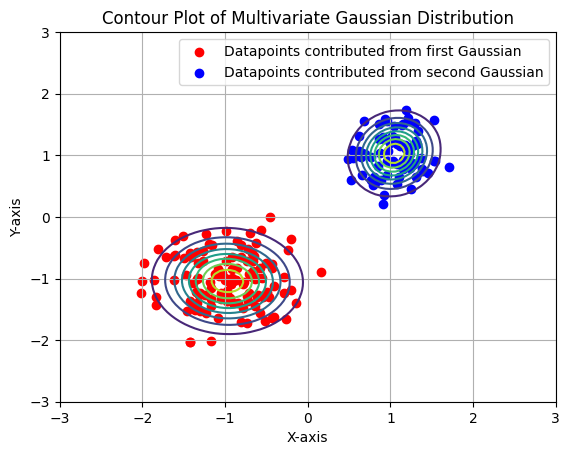

In [ ]:
##Part-6)-d: Understand the issues with EM algorithm
############################################################################


# Spherical covariance
# Singularity may occur with this initialization

data = data_sp    #data to run EM-algorithm
labels = labels_sp  #labels
N = 200       #number of input examples
D = 2       #data dimension
M = 2       #no.of components in GMM

pi = np.array([0.5, 0.5])      #Initialize the prior probabilities
mu1_i = np.array([-1, 1])
mu2_i = np.array([1, -1])
sig1_i = np.array([[1, 0], [0, 1]])
sig2_i = np.array([[1, 0], [0, 1]])

mu = np.asarray([mu1_i, mu2_i])      #Initialize the mean vectors
sigma = np.asarray([sig1_i, sig2_i])   #Initialize the covariance matrices


nsteps = 50  #Number of steps to run EM algorithm
for index in range(0,nsteps,1):

  print("Iteration Number:" + str(index))

  #Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
  print("Current Likelihood: " + str(ll))

  #Expectation step
  gamma = expectation(data, pi, mu, sigma)

  #Plot the contours
  plot_contours(data, labels, pi, mu, sigma, gamma)

  #Maximization step
  pi, mu, sigma = maximization(data, gamma)

Iteration Number:0
Current Likelihood: -576.6990462971264


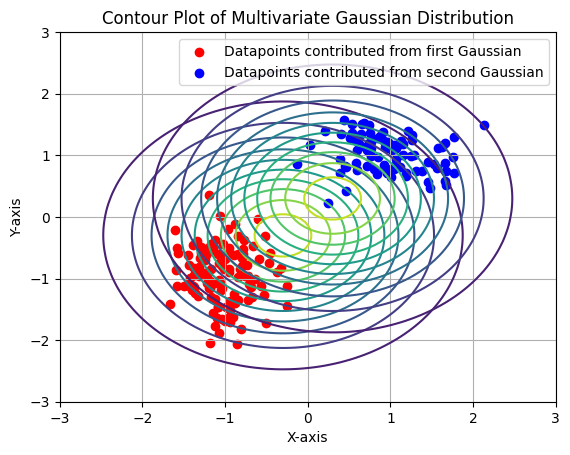

Iteration Number:1
Current Likelihood: -448.16881238861


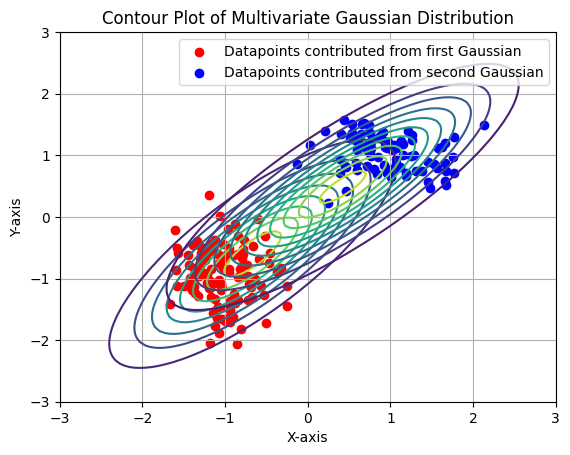

Iteration Number:2
Current Likelihood: -437.9728344685434


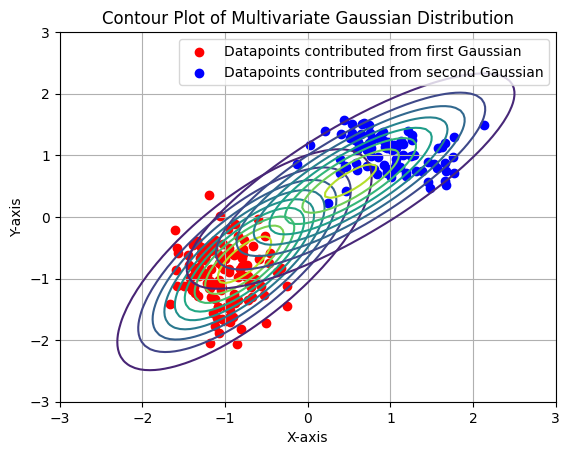

Iteration Number:3
Current Likelihood: -412.18678724826975


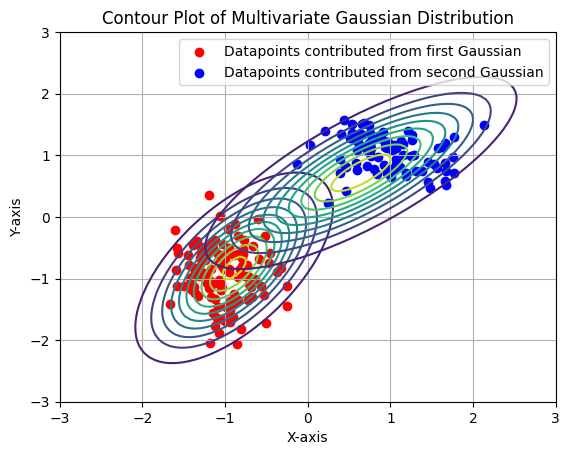

Iteration Number:4
Current Likelihood: -352.7137327296407


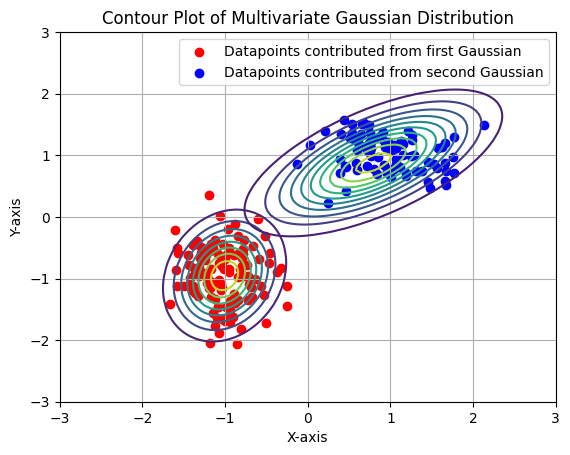

Iteration Number:5
Current Likelihood: -308.76344330707104


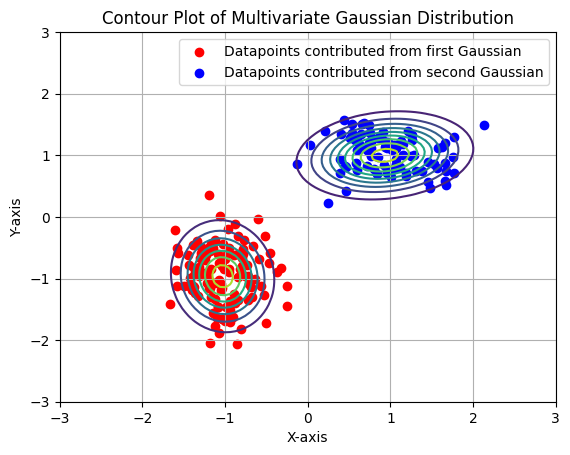

Iteration Number:6
Current Likelihood: -301.1821822689396


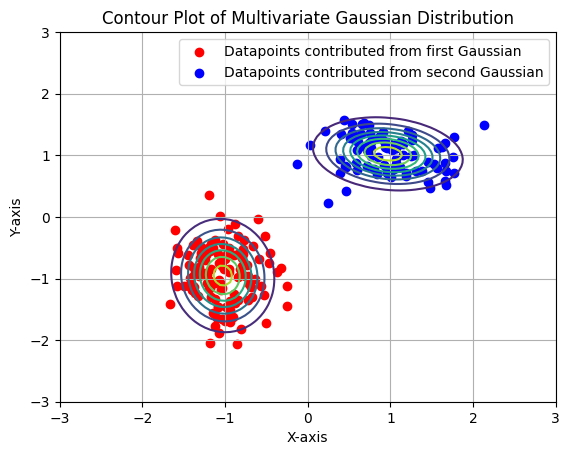

Iteration Number:7
Current Likelihood: -301.18189358916993


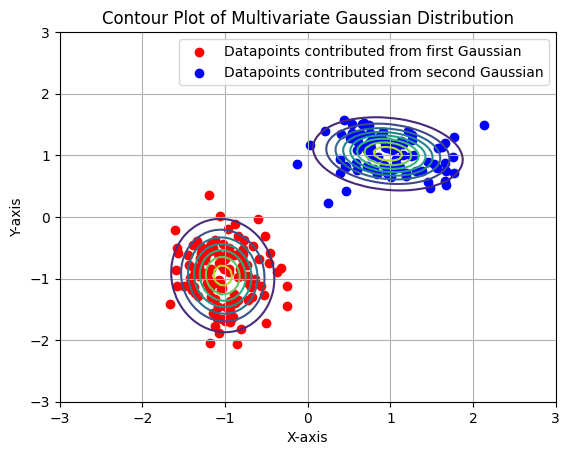

Iteration Number:8
Current Likelihood: -301.18189357916447


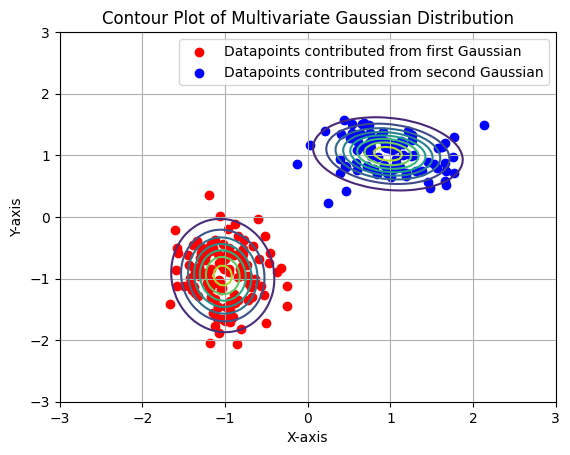

Iteration Number:9
Current Likelihood: -301.18189357916356


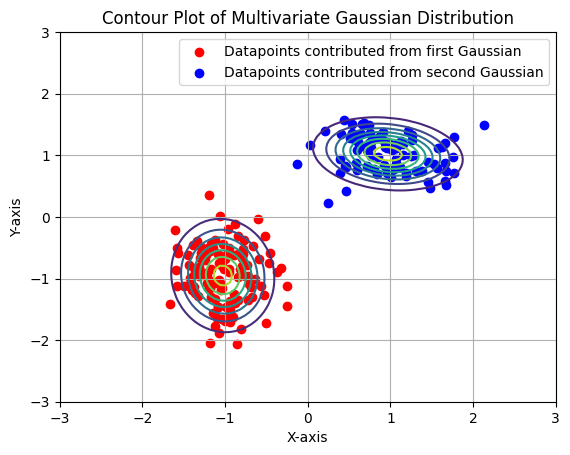

Iteration Number:10
Current Likelihood: -301.18189357916356


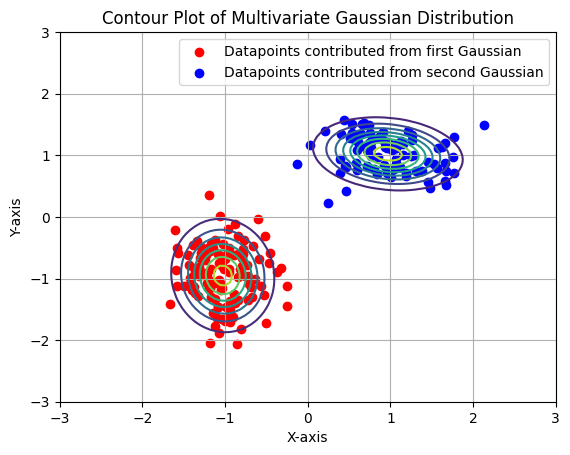

Iteration Number:11
Current Likelihood: -301.1818935791635


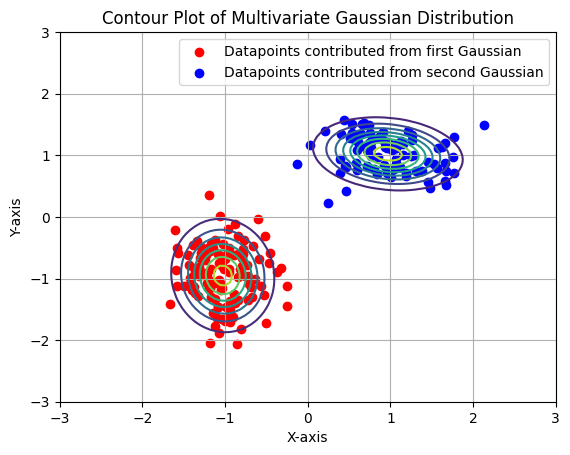

Iteration Number:12
Current Likelihood: -301.18189357916356


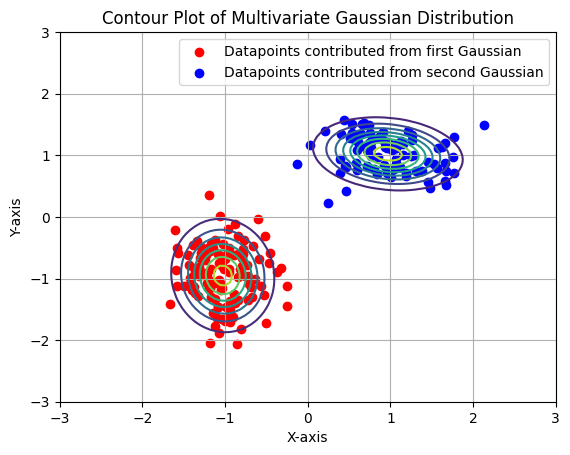

Iteration Number:13
Current Likelihood: -301.18189357916344


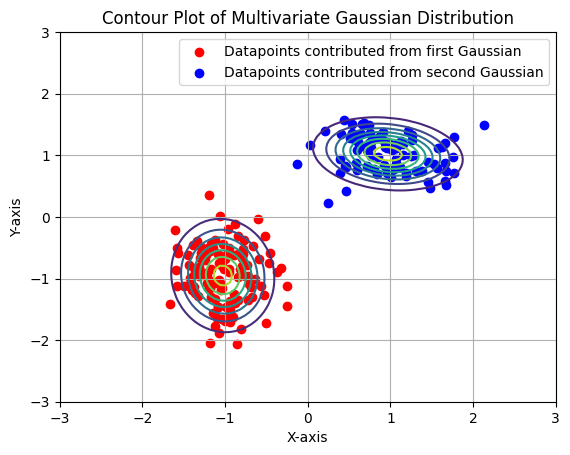

Iteration Number:14
Current Likelihood: -301.18189357916344


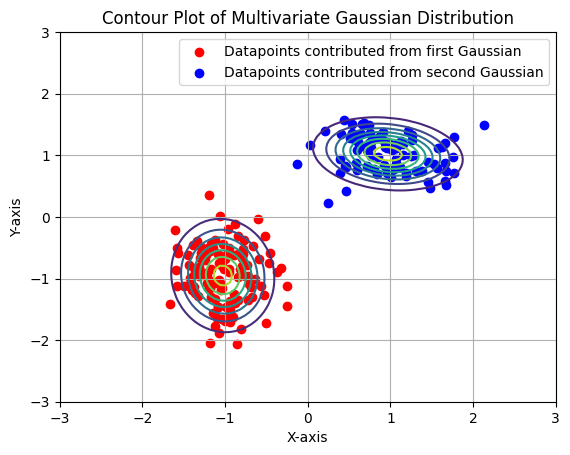

Iteration Number:15
Current Likelihood: -301.18189357916344


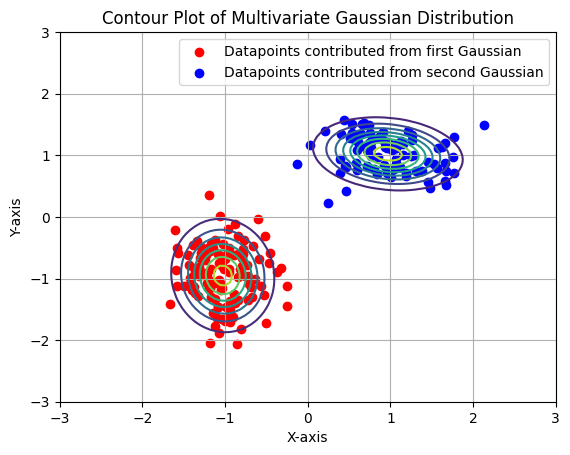

Iteration Number:16
Current Likelihood: -301.18189357916344


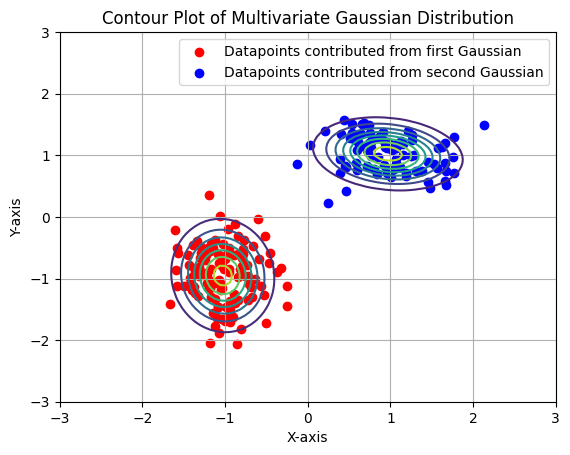

Iteration Number:17
Current Likelihood: -301.18189357916344


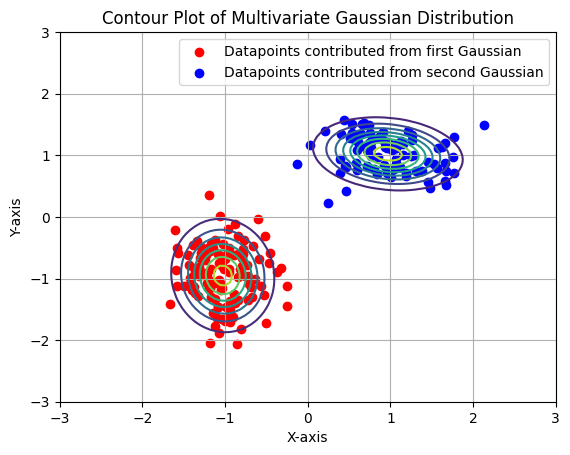

Iteration Number:18
Current Likelihood: -301.18189357916344


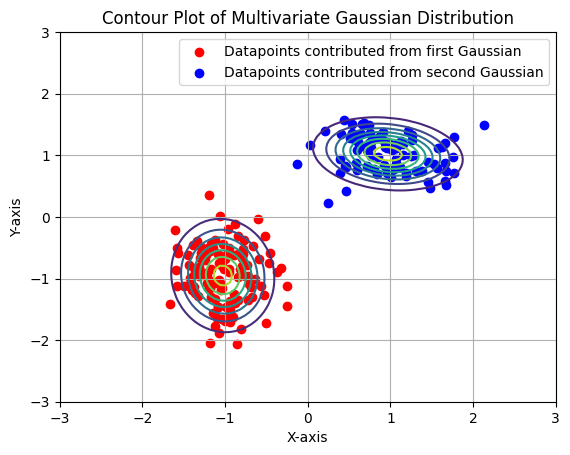

Iteration Number:19
Current Likelihood: -301.18189357916344


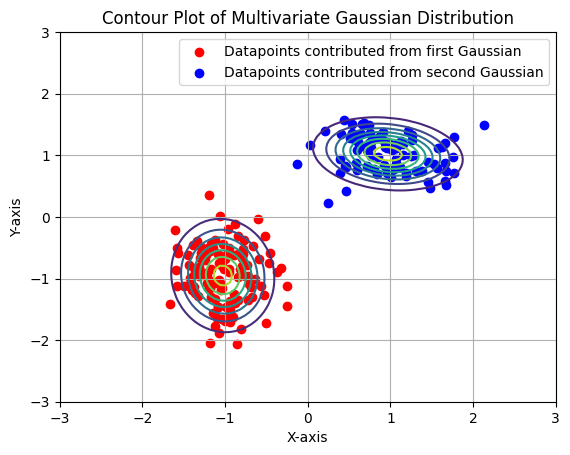

In [ ]:
############################################################################
##Part-6)-d: Understand the issues with EM algorithm
############################################################################

# Diagonal Covariances
# Singularity may occur with below initialization

data = data_dg    #data to run EM-algorithm
labels = labels_dg  #labels
N = 200       #number of input examples
D = 2       #data dimension
M = 2       #no.of components in GMM

pi = np.array([0.5, 0.5])      #Initialize the prior probabilities
mu1_i = np.array([-0.3, -0.3])
mu2_i = np.array([0.3, 0.3])
sig1_i = np.array([[1, 0], [0, 1]])
sig2_i = np.array([[1, 0], [0, 1]])

mu = np.asarray([mu1_i, mu2_i])      #Initialize the mean vectors
sigma = np.asarray([sig1_i, sig2_i])   #Initialize the covariance matrices


nsteps = 20  #Number of steps to run EM algorithm
for index in range(0,nsteps,1):

  print("Iteration Number:" + str(index))

  #Compute the likelihood
  ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
  print("Current Likelihood: " + str(ll))

  #Expectation step
  gamma = expectation(data, pi, mu, sigma)

  #Plot the contours
  plot_contours(data, labels, pi, mu, sigma, gamma)

  #Maximization step
  pi, mu, sigma = maximization(data, gamma)







<b> Report your observations </b>


1. Expectation-Maximation is highly dependent on parameter initialization for optimal convergence

Though experimenting with various means, (If means are intilizaed too far from the actual might result in singluarily as was observed in (-40,40) and (40,40) )<br/>

Also if the means are initialized oppositely, this results in opposite classificatioon.. which is severe error <br/>



On changin the covariances and keeping the means same not much effect was observed, the algorithm converged with almost similar iteration

2. The number of steps that algorithm took to converge in the case of full covariances is considerably lower than steps it took in convergence for spherical and diagonal covariances underlying data



